# Play with codes Not with Emotions

# Emotion Classifier

Due to social media platforms there are lots of comments everyday.Generally the comments are friendly and have good intentions.But sometimes comments convey the feelings of anger ,sadness,fear etc.Negative comments provide evidence that you cannot succeed at your goals, which can also be demotivating.So our task is to predict the various emotions of the comments

In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import spacy
import gensim
import matplotlib.pyplot as plt
from spacy.lang.en.stop_words import STOP_WORDS

In [2]:
emotions=pd.read_table("train.txt",delimiter=";",header=None,)

In [3]:
emotions

,0,1
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger
...,...,...
15995,i just had a very brief time in the beanbag an...,sadness
15996,i am now turning and i feel pathetic that i am...,sadness
15997,i feel strong and good overall,joy
15998,i feel like this was such a rude comment and i...,anger


In [4]:
emotions.columns=['Text','emotion']

In [5]:
emotions

,Text,emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger
...,...,...
15995,i just had a very brief time in the beanbag an...,sadness
15996,i am now turning and i feel pathetic that i am...,sadness
15997,i feel strong and good overall,joy
15998,i feel like this was such a rude comment and i...,anger


## Filtering number of observations as per requirement

In [6]:
emotions=emotions.iloc[:14000]

In [7]:
emotions

,Text,emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger
...,...,...
13995,i love those cars and i feel that my second at...,joy
13996,i feel anything for relationships the doomed one,sadness
13997,i should just let him calm down on his own but...,sadness
13998,when i saw a man hitting a child of years with...,anger


In [8]:
emotions['emotion'].value_counts()

joy         4740
sadness     4051
anger       1881
fear        1688
love        1138
surprise     502
Name: emotion, dtype: int64

/usr/local/lib/python3.9/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='emotion', ylabel='count'>

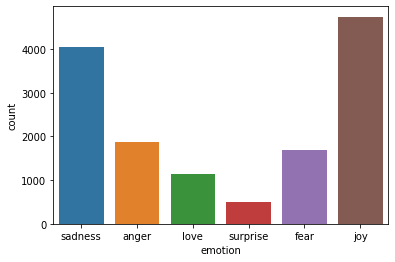

In [9]:
sns.countplot(emotions['emotion'])

In [10]:
nlp=spacy.load('en_core_web_sm')

In [11]:
type(nlp)

spacy.lang.en.English

In [12]:
df=emotions

In [13]:
df

,Text,emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger
...,...,...
13995,i love those cars and i feel that my second at...,joy
13996,i feel anything for relationships the doomed one,sadness
13997,i should just let him calm down on his own but...,sadness
13998,when i saw a man hitting a child of years with...,anger


In [14]:
type(df)

pandas.core.frame.DataFrame

#### Creating 6 different dataframes for 6 different emotions and extracting text for further analysis

In [15]:
df_sad = df[df['emotion'] == 'sadness']

In [16]:
df_sad

,Text,emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
5,ive been feeling a little burdened lately wasn...,sadness
10,i feel like i have to make the suffering i m s...,sadness
13,i feel low energy i m just thirsty,sadness
...,...,...
13991,i mean memories that make me feel dirty and un...,sadness
13992,i was feeling isolated lonely and misunderstood,sadness
13996,i feel anything for relationships the doomed one,sadness
13997,i should just let him calm down on his own but...,sadness


In [17]:
sad=df_sad['Text']

In [18]:
sad

0                                  i didnt feel humiliated
1        i can go from feeling so hopeless to so damned...
5        ive been feeling a little burdened lately wasn...
10       i feel like i have to make the suffering i m s...
13                      i feel low energy i m just thirsty
                               ...                        
13991    i mean memories that make me feel dirty and un...
13992      i was feeling isolated lonely and misunderstood
13996     i feel anything for relationships the doomed one
13997    i should just let him calm down on his own but...
13999    i don t know if these children will fulfill th...
Name: Text, Length: 4051, dtype: object

In [19]:
text_sad = sad.str.cat(sep=' ')

In [20]:
sad_doc=nlp(text_sad)

In [21]:
sad_doc

i didnt feel humiliated i can go from feeling so hopeless to so damned hopeful just from being around someone who cares and is awake ive been feeling a little burdened lately wasnt sure why that was i feel like i have to make the suffering i m seeing mean something i feel low energy i m just thirsty i didnt really feel that embarrassed i feel pretty pathetic most of the time i started feeling sentimental about dolls i had as a child and so began a collection of vintage barbie dolls from the sixties i still love my so and wish the best for him i can no longer tolerate the effect that bm has on our lives and the fact that is has turned my so into a bitter angry person who is not always particularly kind to the people around him when he is feeling stressed i feel so inhibited in someone elses kitchen like im painting on someone elses picture i become overwhelmed and feel defeated i was feeling so discouraged we are already robbing peter to pay paul to get our cow this year but we cant aff

In [22]:
df_anger = df[df['emotion'] == 'anger']

In [23]:
df_anger

,Text,emotion
2,im grabbing a minute to post i feel greedy wrong,anger
4,i am feeling grouchy,anger
12,i think it s the easiest time of year to feel ...,anger
20,i feel irritated and rejected without anyone d...,anger
24,i already feel like i fucked up though because...,anger
...,...,...
13971,i am thankful for the safety of my loved ones ...,anger
13972,im currently feeling cranky for silly reasons ...,anger
13993,ive been feeling cranky lately,anger
13994,i feel like there are people out there on the ...,anger


In [24]:
anger=df_anger['Text']

In [25]:
anger

2         im grabbing a minute to post i feel greedy wrong
4                                     i am feeling grouchy
12       i think it s the easiest time of year to feel ...
20       i feel irritated and rejected without anyone d...
24       i already feel like i fucked up though because...
                               ...                        
13971    i am thankful for the safety of my loved ones ...
13972    im currently feeling cranky for silly reasons ...
13993                       ive been feeling cranky lately
13994    i feel like there are people out there on the ...
13998    when i saw a man hitting a child of years with...
Name: Text, Length: 1881, dtype: object

In [26]:
text_anger=anger.str.cat(sep=' ')

In [27]:
anger_doc=nlp(text_anger)

In [28]:
anger_doc

im grabbing a minute to post i feel greedy wrong i am feeling grouchy i think it s the easiest time of year to feel dissatisfied i feel irritated and rejected without anyone doing anything or saying anything i already feel like i fucked up though because i dont usually eat at all in the morning i feel kinda appalled that she feels like she needs to explain in wide and lenghth her body measures etc pp i climbed the hill feeling frustrated that id pretty much paced entirely wrong for this course and that a factor that has never ever hampered me had made such a dent in the day i feel a bit rude writing to an elderly gentleman to ask for gifts because i feel a bit greedy but what is christmas about if not mild greed i stopped feeling cold and began feeling hot i feel selfish and spoiled i feel selfish as i read back to my former posts how i have never asked for prayers for others how i never considered that there may be others out there that deserve their prayers answered before my own i k

In [29]:
df_love = df[df['emotion'] == 'love']

In [30]:
df_love

,Text,emotion
3,i am ever feeling nostalgic about the fireplac...,love
9,i feel romantic too,love
47,i can t let go of that sad feeling that i want...,love
61,i ate i could feel a gentle tingle throughout ...,love
68,i suppose my own truth needs to be shared i ha...,love
...,...,...
13946,i do my best at making sure my husband feels l...,love
13959,i never feel accepted but you have to go throu...,love
13961,im feeling generous i am gonna tell you about ...,love
13974,i feel so blessed to be apart of it,love


In [31]:
love=df_love['Text']

In [32]:
love

3        i am ever feeling nostalgic about the fireplac...
9                                      i feel romantic too
47       i can t let go of that sad feeling that i want...
61       i ate i could feel a gentle tingle throughout ...
68       i suppose my own truth needs to be shared i ha...
                               ...                        
13946    i do my best at making sure my husband feels l...
13959    i never feel accepted but you have to go throu...
13961    im feeling generous i am gonna tell you about ...
13974                  i feel so blessed to be apart of it
13983    i find myself crying over loosing everything t...
Name: Text, Length: 1138, dtype: object

In [33]:
text_love =love.str.cat(sep=' ')

In [34]:
love_doc=nlp(text_love)

In [35]:
love_doc

i am ever feeling nostalgic about the fireplace i will know that it is still on the property i feel romantic too i can t let go of that sad feeling that i want to be accepted here in this first home of mine i ate i could feel a gentle tingle throughout almost as if i was feeling the healing taking place at a cellular level i suppose my own truth needs to be shared i havent been feeling very faithful lately ive dwelled more in doubt and uncertainty than i have in faith i was ready to meet mom in the airport and feel her ever supportive arms around me i talk to dogs as i feel they cannot understand words but they can read emotions and know how to be supportive i decided i should go home i wont let me child cry it out because i feel that loving her and lily when she was little was going to be opportunities that only lasted for those short few months i feel like some of you have pains and you cannot imagine becoming passionate about the group or the idea that is causing pain i am very exci

In [36]:
df_surprise = df[df['emotion'] == 'surprise']

In [37]:
df_surprise

,Text,emotion
6,ive been taking or milligrams or times recomme...,surprise
32,i have seen heard and read over the past coupl...,surprise
57,i keep feeling pleasantly surprised at his sup...,surprise
64,i am now nearly finished the week detox and i ...,surprise
129,i too feel as if i am a stranger in a strange ...,surprise
...,...,...
13778,i want to feel amazed a little more often,surprise
13787,i shook my head feeling dazed,surprise
13802,id love to know in the comments i feel like it...,surprise
13891,im feeling a little overwhelmed here recently,surprise


In [38]:
surprise=df_surprise['Text']

In [39]:
surprise

6        ive been taking or milligrams or times recomme...
32       i have seen heard and read over the past coupl...
57       i keep feeling pleasantly surprised at his sup...
64       i am now nearly finished the week detox and i ...
129      i too feel as if i am a stranger in a strange ...
                               ...                        
13778            i want to feel amazed a little more often
13787                        i shook my head feeling dazed
13802    id love to know in the comments i feel like it...
13891        im feeling a little overwhelmed here recently
13960    i feel the tug of the fabric against my thighs...
Name: Text, Length: 502, dtype: object

In [40]:
text_surprise = surprise.str.cat(sep=' ')

In [41]:
surprise_doc=nlp(text_surprise)

In [42]:
surprise_doc

ive been taking or milligrams or times recommended amount and ive fallen asleep a lot faster but i also feel like so funny i have seen heard and read over the past couple of days i am left feeling impressed by more than a few companies i keep feeling pleasantly surprised at his supportiveness and also his ease in new situations i am now nearly finished the week detox and i feel amazing i too feel as if i am a stranger in a strange land and i am raising my son in a place that is not his father s ancestral home i started feeling funny and then friday i woke up sick as a dog im certainly not going to sit and tell you whats going on in my personal life but i feel that if you were ever curious about whats going in my life all youd have to do is watch the show im sorry that there wasnt more humor in this post but im not feeling all that funny i want to hold this feeling of shocked awe and wonder forever i will enclose her verses on her could not weigh much more thinking and feeling curious t

In [43]:
df_fear = df[df['emotion'] == 'fear']

In [44]:
df_fear

,Text,emotion
7,i feel as confused about life as a teenager or...,fear
19,i now feel compromised and skeptical of the va...,fear
21,i am feeling completely overwhelmed i have two...,fear
31,i remember feeling acutely distressed for a fe...,fear
53,i was stymied a little bit as i wrote feeling ...,fear
...,...,...
13958,i was just feeling terrified terrified of the ...,fear
13965,i start feeling overwhelmed and i just want to...,fear
13973,i read up on the practicies and cult like beli...,fear
13985,im feeling quite distressed about the amount o...,fear


In [45]:
fear=df_fear['Text']

In [46]:
fear

7        i feel as confused about life as a teenager or...
19       i now feel compromised and skeptical of the va...
21       i am feeling completely overwhelmed i have two...
31       i remember feeling acutely distressed for a fe...
53       i was stymied a little bit as i wrote feeling ...
                               ...                        
13958    i was just feeling terrified terrified of the ...
13965    i start feeling overwhelmed and i just want to...
13973    i read up on the practicies and cult like beli...
13985    im feeling quite distressed about the amount o...
13989    i began to feel very afraid of disappointment ...
Name: Text, Length: 1688, dtype: object

In [47]:
text_fear = fear.str.cat(sep=' ')

In [48]:
fear_doc=nlp(text_fear)

In [49]:
fear_doc

i feel as confused about life as a teenager or as jaded as a year old man i now feel compromised and skeptical of the value of every unit of work i put in i am feeling completely overwhelmed i have two strategies that help me to feel grounded pour my heart out in my journal in the form of a letter to god and then end with a list of five things i am most grateful for i remember feeling acutely distressed for a few days i was stymied a little bit as i wrote feeling unsure that i might go somewhere with the story unintended i feel like we are pressured into being young beautiful thin and depending on the trend having the girls rejuvenated or butt implants i began having them several times a week feeling tortured by the hallucinations moving people and figures sounds and vibrations i will be able to lay on my bed in the dark and not feel terrified at least for a while i had begun to feel apprehensive when thick black rain clouds stormed into the sky above town i had stated to her the reaso

In [50]:
df_joy = df[df['emotion'] == 'joy']

In [51]:
df_joy

,Text,emotion
8,i have been with petronas for years i feel tha...,joy
11,i do feel that running is a divine experience ...,joy
14,i have immense sympathy with the general point...,joy
15,i do not feel reassured anxiety is on each side,joy
22,i have the feeling she was amused and delighted,joy
...,...,...
13977,i did not feel as hopeful yesterday our small ...,joy
13982,i was feeling fairly comfortable and i could t...,joy
13984,ive been desperately trying to finish up my ma...,joy
13986,i could feel myself putting on that i m simply...,joy


In [52]:
joy=df_joy['Text']

In [53]:
joy

8        i have been with petronas for years i feel tha...
11       i do feel that running is a divine experience ...
14       i have immense sympathy with the general point...
15         i do not feel reassured anxiety is on each side
22         i have the feeling she was amused and delighted
                               ...                        
13977    i did not feel as hopeful yesterday our small ...
13982    i was feeling fairly comfortable and i could t...
13984    ive been desperately trying to finish up my ma...
13986    i could feel myself putting on that i m simply...
13995    i love those cars and i feel that my second at...
Name: Text, Length: 4740, dtype: object

In [54]:
text_joy= joy.str.cat(sep=' ')

In [55]:
joy_doc=nlp(text_joy)

In [56]:
joy_doc

i have been with petronas for years i feel that petronas has performed well and made a huge profit i do feel that running is a divine experience and that i can expect to have some type of spiritual encounter i have immense sympathy with the general point but as a possible proto writer trying to find time to write in the corners of life and with no sign of an agent let alone a publishing contract this feels a little precious i do not feel reassured anxiety is on each side i have the feeling she was amused and delighted i was able to help chai lifeline with your support and encouragement is a great feeling and i am so glad you were able to help me i feel more superior dead chicken or grieving child i get giddy over feeling elegant in a perfectly fitted pencil skirt i can t imagine a real life scenario where i would be emotionally connected enough with someone to feel totally accepted and safe where it it morally acceptable for me to have close and prolonged physical contact and where sex

# Data Pre-processing

## Tokenization

In [57]:
def tokenize_text(text):
    doc = nlp(text)
    return [token.text for token in doc]

In [58]:
emotions["text_tokens"] = emotions["Text"].apply(tokenize_text)

<ipython-input-58-c361c28046f7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emotions["text_tokens"] = emotions["Text"].apply(tokenize_text)


In [59]:
emotions.head()

,Text,emotion,text_tokens
0,i didnt feel humiliated,sadness,"[i, did, nt, feel, humiliated]"
1,i can go from feeling so hopeless to so damned...,sadness,"[i, can, go, from, feeling, so, hopeless, to, ..."
2,im grabbing a minute to post i feel greedy wrong,anger,"[i, m, grabbing, a, minute, to, post, i, feel,..."
3,i am ever feeling nostalgic about the fireplac...,love,"[i, am, ever, feeling, nostalgic, about, the, ..."
4,i am feeling grouchy,anger,"[i, am, feeling, grouchy]"


In [60]:
emotions['emotion'].value_counts()

joy         4740
sadness     4051
anger       1881
fear        1688
love        1138
surprise     502
Name: emotion, dtype: int64

In [61]:
tokens=emotions["text_tokens"]

In [62]:
tokens

0                           [i, did, nt, feel, humiliated]
1        [i, can, go, from, feeling, so, hopeless, to, ...
2        [i, m, grabbing, a, minute, to, post, i, feel,...
3        [i, am, ever, feeling, nostalgic, about, the, ...
4                                [i, am, feeling, grouchy]
                               ...                        
13995    [i, love, those, cars, and, i, feel, that, my,...
13996    [i, feel, anything, for, relationships, the, d...
13997    [i, should, just, let, him, calm, down, on, hi...
13998    [when, i, saw, a, man, hitting, a, child, of, ...
13999    [i, don, t, know, if, these, children, will, f...
Name: text_tokens, Length: 14000, dtype: object

## Label encoding

In [63]:
from sklearn.preprocessing import LabelEncoder

In [64]:
label_encoder = LabelEncoder()

In [65]:
label_encoder.fit(emotions["emotion"])

LabelEncoder()

In [66]:
emotions["encoded_label"] = label_encoder.transform(emotions["emotion"])

<ipython-input-66-12f4c8b2f703>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emotions["encoded_label"] = label_encoder.transform(emotions["emotion"])


In [67]:
emotions

,Text,emotion,text_tokens,encoded_label
0,i didnt feel humiliated,sadness,"[i, did, nt, feel, humiliated]",4
1,i can go from feeling so hopeless to so damned...,sadness,"[i, can, go, from, feeling, so, hopeless, to, ...",4
2,im grabbing a minute to post i feel greedy wrong,anger,"[i, m, grabbing, a, minute, to, post, i, feel,...",0
3,i am ever feeling nostalgic about the fireplac...,love,"[i, am, ever, feeling, nostalgic, about, the, ...",3
4,i am feeling grouchy,anger,"[i, am, feeling, grouchy]",0
...,...,...,...,...
13995,i love those cars and i feel that my second at...,joy,"[i, love, those, cars, and, i, feel, that, my,...",2
13996,i feel anything for relationships the doomed one,sadness,"[i, feel, anything, for, relationships, the, d...",4
13997,i should just let him calm down on his own but...,sadness,"[i, should, just, let, him, calm, down, on, hi...",4
13998,when i saw a man hitting a child of years with...,anger,"[when, i, saw, a, man, hitting, a, child, of, ...",0


In [68]:
emotions['encoded_label'].value_counts()

2    4740
4    4051
0    1881
1    1688
3    1138
5     502
Name: encoded_label, dtype: int64

## Extracting text data from the dataset

In [69]:
data=emotions['Text']

In [70]:
data

0                                  i didnt feel humiliated
1        i can go from feeling so hopeless to so damned...
2         im grabbing a minute to post i feel greedy wrong
3        i am ever feeling nostalgic about the fireplac...
4                                     i am feeling grouchy
                               ...                        
13995    i love those cars and i feel that my second at...
13996     i feel anything for relationships the doomed one
13997    i should just let him calm down on his own but...
13998    when i saw a man hitting a child of years with...
13999    i don t know if these children will fulfill th...
Name: Text, Length: 14000, dtype: object

In [71]:
data.shape

(14000,)

In [72]:
type(data)

pandas.core.series.Series

In [73]:
text_doc = data.str.cat(sep=' ')

In [74]:
text_doc

'i didnt feel humiliated i can go from feeling so hopeless to so damned hopeful just from being around someone who cares and is awake im grabbing a minute to post i feel greedy wrong i am ever feeling nostalgic about the fireplace i will know that it is still on the property i am feeling grouchy ive been feeling a little burdened lately wasnt sure why that was ive been taking or milligrams or times recommended amount and ive fallen asleep a lot faster but i also feel like so funny i feel as confused about life as a teenager or as jaded as a year old man i have been with petronas for years i feel that petronas has performed well and made a huge profit i feel romantic too i feel like i have to make the suffering i m seeing mean something i do feel that running is a divine experience and that i can expect to have some type of spiritual encounter i think it s the easiest time of year to feel dissatisfied i feel low energy i m just thirsty i have immense sympathy with the general point but 

In [75]:
type(text_doc)

str

In [76]:
nlp.max_length = 2000000

In [77]:
doc=nlp(text_doc)

In [78]:
doc

i didnt feel humiliated i can go from feeling so hopeless to so damned hopeful just from being around someone who cares and is awake im grabbing a minute to post i feel greedy wrong i am ever feeling nostalgic about the fireplace i will know that it is still on the property i am feeling grouchy ive been feeling a little burdened lately wasnt sure why that was ive been taking or milligrams or times recommended amount and ive fallen asleep a lot faster but i also feel like so funny i feel as confused about life as a teenager or as jaded as a year old man i have been with petronas for years i feel that petronas has performed well and made a huge profit i feel romantic too i feel like i have to make the suffering i m seeing mean something i do feel that running is a divine experience and that i can expect to have some type of spiritual encounter i think it s the easiest time of year to feel dissatisfied i feel low energy i m just thirsty i have immense sympathy with the general point but a

In [79]:
type(doc)

spacy.tokens.doc.Doc

In [80]:
len(doc)

273356

### Checking stop words, punctuation, numbers and lower casing 

In [81]:
from spacy.lang.en.stop_words import STOP_WORDS

In [82]:
print(STOP_WORDS)

{'never', 'even', 'then', 'not', 'latterly', 'four', 'made', "'d", 'but', 'unless', 'my', 'six', 'already', 'ever', 'always', 'also', 'although', '’ve', 'make', 'formerly', 'herein', 'first', 'moreover', 'someone', 'had', 'seem', 'which', 'during', 'nine', 'several', 'often', 'bottom', '’s', 'been', 'whereas', 'last', 'such', 'now', 'nowhere', 'or', 'your', 'we', 'among', 'noone', 'put', 'most', 'beyond', 'really', 'yours', 'n’t', 'anywhere', 'off', 'too', 'within', 'using', 'seeming', 'hereby', 'upon', 'together', 'wherein', 'keep', 'up', '‘s', 'much', 'least', 'after', 'anything', 'ours', 'around', "'ve", 'his', 'at', 'wherever', 'above', 'per', 'thus', 'amount', 'anyway', 'nor', 'give', 'any', 'to', 'top', 'forty', 'once', 'towards', 'whoever', 'meanwhile', 'along', 'fifteen', '‘re', '’d', 'beside', 'elsewhere', 'five', 'are', 'regarding', 'through', 'became', 're', 'would', 'latter', 'each', 'side', 'throughout', 'whereafter', 'sometime', 'only', '‘m', 'amongst', 'other', 'can', 't

In [83]:
# No of non-stop words in the data

s_count=0
for token in doc:
    if token.is_stop == False:
        s_count=s_count+1
print('\n The no of non-stop words:',s_count)


 The no of non-stop words: 117041


In [84]:
# No of stop words in the data

s_count=0
for token in doc:
    if token.is_stop == True:
        s_count=s_count+1
print('\n The no of stop words:',s_count)


 The no of stop words: 156315


In [85]:
# No of punctuations in the data

count_punct=0
for token in doc:
    if(token.is_punct):
        print(token)
        count_punct=count_punct+1
print("No. of punctuations in doc:",count_punct)

No. of punctuations in doc: 0


In [86]:
# No of title cases in the data

t_count=0
for token in doc:
    if token.is_title == True:
        t_count=t_count+1
        print(token)
print('\n The no of title cases:',t_count)


 The no of title cases: 0


In [87]:
#no. of numbers in the data
count_num=0
for token in doc:
    if(token.like_num):
        count_num=count_num+1
print("No. of Numbers in my_doc:",count_num)

No. of Numbers in my_doc: 1054


### Removing stop words, punctuation, numbers and lower casing 

In [88]:
# Removing stop words, punctuation, numbers and lower casing the doc

cleaned_doc=[token for token in doc
             if not token.is_stop and not token.is_punct and not token.is_space and token.text!='XXXX' and token.text!='XX']


In [89]:
print(cleaned_doc)

[nt, feel, humiliated, feeling, hopeless, damned, hopeful, cares, awake, m, grabbing, minute, post, feel, greedy, wrong, feeling, nostalgic, fireplace, know, property, feeling, grouchy, ve, feeling, little, burdened, lately, nt, sure, ve, taking, milligrams, times, recommended, ve, fallen, asleep, lot, faster, feel, like, funny, feel, confused, life, teenager, jaded, year, old, man, petronas, years, feel, petronas, performed, huge, profit, feel, romantic, feel, like, suffering, m, seeing, mean, feel, running, divine, experience, expect, type, spiritual, encounter, think, s, easiest, time, year, feel, dissatisfied, feel, low, energy, m, thirsty, immense, sympathy, general, point, possible, proto, writer, trying, find, time, write, corners, life, sign, agent, let, publishing, contract, feels, little, precious, feel, reassured, anxiety, nt, feel, embarrassed, feel, pretty, pathetic, time, started, feeling, sentimental, dolls, child, began, collection, vintage, barbie, dolls, sixties, feel

In [90]:
print('Length of the doc after cleaning:',len(cleaned_doc))

Length of the doc after cleaning: 117041


In [91]:
type(cleaned_doc)

list

## Lemmatisation

In [92]:
for token in cleaned_doc:
    print(token.text,'-',token.lemma_)

Streaming output truncated to the last 5000 lines.
walk - walk
head - head
held - hold
high - high
sugar - sugar
laden - laden
roasted - roast
chocolate - chocolate
cake - cake
like - like
best - good
em - em
tell - tell
vegan - vegan
phase - phase
perfectly - perfectly
understandable - understandable
year - year
old - old
girl - girl
feel - feel
thrilled - thrilled
vegan - vegan
wish - wish
continued - continued
success - success
health - health
m - m
feeling - feel
little - little
smug - smug
evening - evening
tender - tender
feelings - feeling
sweet - sweet
woman - woman
suffered - suffer
silence - silence
nt - not
help - help
feel - feel
bioware - bioware
missed - miss
opportunity - opportunity
feel - feel
ok - ok
results - result
nt - not
want - want
talk - talk
kind - kind
selfish - selfish
feel - feel
d - d
ignore - ignore
selfish - selfish
wish - wish
nt - not
feel - feel
like - like
roommates - roommate
hated - hate
half - half
time - time
left - leave
talk - talk
feeling - fe

## PoS(Parts of Speech) tagging

In [93]:
for token in cleaned_doc:
    print(token.text,"====>",token.pos_,"====>",token.tag_,'====>',token.dep_)

Streaming output truncated to the last 5000 lines.
walk ====> VERB ====> VBP ====> advcl
head ====> NOUN ====> NN ====> nsubj
held ====> VERB ====> VBN ====> pcomp
high ====> ADV ====> RB ====> advmod
sugar ====> NOUN ====> NN ====> compound
laden ====> NOUN ====> NN ====> nsubj
roasted ====> VERB ====> VBN ====> ccomp
chocolate ====> NOUN ====> NN ====> compound
cake ====> NOUN ====> NN ====> dobj
like ====> ADP ====> IN ====> prep
best ====> ADJ ====> JJS ====> pobj
em ====> PRON ====> PRP ====> pobj
tell ====> VERB ====> VB ====> conj
vegan ====> NOUN ====> NN ====> compound
phase ====> NOUN ====> NN ====> dobj
perfectly ====> ADV ====> RB ====> advmod
understandable ====> ADJ ====> JJ ====> acomp
year ====> NOUN ====> NN ====> npadvmod
old ====> ADJ ====> JJ ====> amod
girl ====> NOUN ====> NN ====> nsubj
feel ====> VERB ====> VB ====> advcl
thrilled ====> ADJ ====> JJ ====> acomp
vegan ====> NOUN ====> NN ====> attr
wish ====> VERB ====> VB ====> conj
continued ====> ADJ ====> JJ 

In [94]:
#PARSER- Visualisation
from spacy import displacy
displacy.render(doc,style='dep') 

#### PoS tagging on the cleaned doc

In [95]:
total_count=0
for token in cleaned_doc:
    print(token.text,'====>',token.pos_)
    total_count=total_count+1
print('The count of tokens:',total_count)

Streaming output truncated to the last 5000 lines.
head ====> NOUN
held ====> VERB
high ====> ADV
sugar ====> NOUN
laden ====> NOUN
roasted ====> VERB
chocolate ====> NOUN
cake ====> NOUN
like ====> ADP
best ====> ADJ
em ====> PRON
tell ====> VERB
vegan ====> NOUN
phase ====> NOUN
perfectly ====> ADV
understandable ====> ADJ
year ====> NOUN
old ====> ADJ
girl ====> NOUN
feel ====> VERB
thrilled ====> ADJ
vegan ====> NOUN
wish ====> VERB
continued ====> ADJ
success ====> NOUN
health ====> NOUN
m ====> AUX
feeling ====> VERB
little ====> ADJ
smug ====> NOUN
evening ====> NOUN
tender ====> ADJ
feelings ====> NOUN
sweet ====> ADJ
woman ====> NOUN
suffered ====> VERB
silence ====> NOUN
nt ====> PART
help ====> VERB
feel ====> VERB
bioware ====> NOUN
missed ====> VERB
opportunity ====> NOUN
feel ====> VERB
ok ====> ADJ
results ====> NOUN
nt ====> PART
want ====> VERB
talk ====> VERB
kind ====> NOUN
selfish ====> ADJ
feel ====> VERB
d ====> PROPN
ignore ====> VERB
selfish ====> ADJ
wish ====>

In [96]:
#PoS=NOUN

noun_count=0
for token in cleaned_doc:
    if token.pos_=='NOUN':
        print(token.text,'====>',token.pos_)
        noun_count=noun_count+1
print('The count of tokens with PoS as NOUN:',noun_count)

Streaming output truncated to the last 5000 lines.
thoughts ====> NOUN
weekend ====> NOUN
bit ====> NOUN
relaxation ====> NOUN
downtime ====> NOUN
walls ====> NOUN
week ====> NOUN
working ====> NOUN
packing ====> NOUN
challenge ====> NOUN
money ====> NOUN
night ====> NOUN
gathering ====> NOUN
bit ====> NOUN
today ====> NOUN
winners ====> NOUN
teresa ====> NOUN
problems ====> NOUN
feelings ====> NOUN
problems ====> NOUN
person ====> NOUN
search ====> NOUN
happiness ====> NOUN
happiness ====> NOUN
trip ====> NOUN
epiphany ====> NOUN
rest ====> NOUN
headache ====> NOUN
people ====> NOUN
need ====> NOUN
country ====> NOUN
devastation ====> NOUN
mum ====> NOUN
companion ====> NOUN
years ====> NOUN
katy ====> NOUN
danny ====> NOUN
course ====> NOUN
blog ====> NOUN
course ====> NOUN
feeling ====> NOUN
bit ====> NOUN
things ====> NOUN
head ====> NOUN
feeling ====> NOUN
amp ====> NOUN
sassiness ====> NOUN
feeling ====> NOUN
script ====> NOUN
type ====> NOUN
text ====> NOUN
javascript ====> NOUN

In [97]:
#PoS=VERB

verb_count=0
for token in cleaned_doc:
    if token.pos_=='VERB':
        print(token.text,'====>',token.pos_)
        verb_count=verb_count+1
print('The count of tokens with PoS as VERB:',verb_count)

Streaming output truncated to the last 5000 lines.
feel ====> VERB
feeling ====> VERB
cutting ====> VERB
long ====> VERB
feel ====> VERB
feel ====> VERB
continue ====> VERB
try ====> VERB
lose ====> VERB
feel ====> VERB
feel ====> VERB
tell ====> VERB
left ====> VERB
feel ====> VERB
feel ====> VERB
knowing ====> VERB
stay ====> VERB
feel ====> VERB
feeling ====> VERB
related ====> VERB
feeling ====> VERB
left ====> VERB
feeling ====> VERB
damaged ====> VERB
remaining ====> VERB
started ====> VERB
feeling ====> VERB
think ====> VERB
come ====> VERB
given ====> VERB
feel ====> VERB
understand ====> VERB
feel ====> VERB
fucking ====> VERB
wanted ====> VERB
share ====> VERB
believe ====> VERB
feel ====> VERB
told ====> VERB
feel ====> VERB
partaking ====> VERB
feel ====> VERB
shaken ====> VERB
feeling ====> VERB
want ====> VERB
celebrate ====> VERB
feel ====> VERB
feeling ====> VERB
joined ====> VERB
feel ====> VERB
feel ====> VERB
know ====> VERB
opening ====> VERB
feel ====> VERB
learn =

In [98]:
#PoS=Proper noun

propn_count=0
for token in cleaned_doc:
    if token.pos_=='PROPN':
        print(token.text,'====>',token.pos_)
        propn_count=propn_count+1
print('The count of tokens with PoS as PROPN:',propn_count)

god ====> PROPN
bm ====> PROPN
d ====> PROPN
christmas ====> PROPN
christmas ====> PROPN
peter ====> PROPN
paul ====> PROPN
don ====> PROPN
t ====> PROPN
t ====> PROPN
sam ====> PROPN
bag ====> PROPN
qaf ====> PROPN
jacynthe ====> PROPN
lookin ====> PROPN
good ====> PROPN
feelin ====> PROPN
gorgeous ====> PROPN
rupaul ====> PROPN
kayle ====> PROPN
michelle ====> PROPN
ballistic ====> PROPN
don ====> PROPN
t ====> PROPN
didn ====> PROPN
t ====> PROPN
chris ====> PROPN
december ====> PROPN
shit ====> PROPN
friday ====> PROPN
didn ====> PROPN
t ====> PROPN
src ====> PROPN
http ====> PROPN
doesn ====> PROPN
t ====> PROPN
don ====> PROPN
t ====> PROPN
didn ====> PROPN
t ====> PROPN
god ====> PROPN
god ====> PROPN
god ====> PROPN
don ====> PROPN
t ====> PROPN
eid ====> PROPN
friday ====> PROPN
couldn ====> PROPN
t ====> PROPN
manitz ====> PROPN
spanish ====> PROPN
brazil ====> PROPN
emily ====> PROPN
didn ====> PROPN
t ====> PROPN
st ====> PROPN
tango ====> PROPN
didn ====> PROPN
t ====> PRO

In [99]:
#PoS=Adjective

adj_count=0
for token in cleaned_doc:
    if token.pos_=='ADJ':
        print(token.text,'====>',token.pos_)
        adj_count=adj_count+1
print('The count of tokens with PoS as ADJ:',adj_count)

Streaming output truncated to the last 5000 lines.
naked ====> ADJ
ashamed ====> ADJ
dead ====> ADJ
terrified ====> ADJ
miserable ====> ADJ
good ====> ADJ
acceptable ====> ADJ
normal ====> ADJ
blessed ====> ADJ
blessed ====> ADJ
able ====> ADJ
pretty ====> ADJ
pleasant ====> ADJ
honoured ====> ADJ
great ====> ADJ
able ====> ADJ
terrified ====> ADJ
fake ====> ADJ
threatened ====> ADJ
lousy ====> ADJ
exhausted ====> ADJ
irritable ====> ADJ
tiny ====> ADJ
lower ====> ADJ
higher ====> ADJ
frightened ====> ADJ
small ====> ADJ
supportive ====> ADJ
tired ====> ADJ
needy ====> ADJ
curious ====> ADJ
virtuous ====> ADJ
strange ====> ADJ
girly ====> ADJ
treasured ====> ADJ
loyal ====> ADJ
carefree ====> ADJ
old ====> ADJ
best ====> ADJ
href ====> ADJ
terrified ====> ADJ
good ====> ADJ
useless ====> ADJ
spiteful ====> ADJ
low ====> ADJ
dreaded ====> ADJ
fabulous ====> ADJ
bad ====> ADJ
different ====> ADJ
brave ====> ADJ
rare ====> ADJ
golden ====> ADJ
tired ====> ADJ
useless ====> ADJ
tired ====>

In [100]:
#PoS=Adverb

adv_count=0
for token in cleaned_doc:
    if token.pos_=='ADV':
        print(token.text,'====>',token.pos_)
        adv_count=adv_count+1
print('The count of tokens with PoS as ADV:',adv_count)

Streaming output truncated to the last 5000 lines.
upside ====> ADV
actually ====> ADV
away ====> ADV
finally ====> ADV
preferably ====> ADV
incredibly ====> ADV
better ====> ADV
usually ====> ADV
actually ====> ADV
pretty ====> ADV
truly ====> ADV
thoroughly ====> ADV
nikos ====> ADV
soon ====> ADV
speechless ====> ADV
awkward ====> ADV
kinda ====> ADV
inevitably ====> ADV
maybe ====> ADV
actually ====> ADV
pretty ====> ADV
lately ====> ADV
later ====> ADV
better ====> ADV
away ====> ADV
long ====> ADV
seriously ====> ADV
pretty ====> ADV
long ====> ADV
straight ====> ADV
away ====> ADV
deeply ====> ADV
completely ====> ADV
hardly ====> ADV
totally ====> ADV
completely ====> ADV
actually ====> ADV
clearly ====> ADV
absolutely ====> ADV
pretty ====> ADV
home ====> ADV
usually ====> ADV
probably ====> ADV
especially ====> ADV
pretty ====> ADV
wholly ====> ADV
faster ====> ADV
forward ====> ADV
probably ====> ADV
long ====> ADV
instantly ====> ADV
kind ====> ADV
lately ====> ADV
especial

# Topic Modelling

In [101]:
## Creating a doc of all the emotions

merged_emotions=[joy_doc,sad_doc,anger_doc,fear_doc,love_doc,surprise_doc]

In [102]:
merged_emotions

[i have been with petronas for years i feel that petronas has performed well and made a huge profit i do feel that running is a divine experience and that i can expect to have some type of spiritual encounter i have immense sympathy with the general point but as a possible proto writer trying to find time to write in the corners of life and with no sign of an agent let alone a publishing contract this feels a little precious i do not feel reassured anxiety is on each side i have the feeling she was amused and delighted i was able to help chai lifeline with your support and encouragement is a great feeling and i am so glad you were able to help me i feel more superior dead chicken or grieving child i get giddy over feeling elegant in a perfectly fitted pencil skirt i can t imagine a real life scenario where i would be emotionally connected enough with someone to feel totally accepted and safe where it it morally acceptable for me to have close and prolonged physical contact and where se

In [103]:
type(merged_emotions)

list

In [104]:
texts=[]
for document in merged_emotions:
    docd=nlp(document)
    text=[]
    for token in docd:
        if not token.is_stop and not token.is_punct and not token.like_num:
            text.append(token.lemma_) # root form
            
    texts.append(text)

In [105]:
print(texts)

[['petrona', 'year', 'feel', 'petrona', 'perform', 'huge', 'profit', 'feel', 'run', 'divine', 'experience', 'expect', 'type', 'spiritual', 'encounter', 'immense', 'sympathy', 'general', 'point', 'possible', 'proto', 'writer', 'try', 'find', 'time', 'write', 'corner', 'life', 'sign', 'agent', 'let', 'publishing', 'contract', 'feel', 'little', 'precious', 'feel', 'reassure', 'anxiety', 'feeling', 'amuse', 'delight', 'able', 'help', 'chai', 'lifeline', 'support', 'encouragement', 'great', 'feeling', 'glad', 'able', 'help', 'feel', 'superior', 'dead', 'chicken', 'grieve', 'child', 'giddy', 'feel', 'elegant', 'perfectly', 'fit', 'pencil', 'skirt', 't', 'imagine', 'real', 'life', 'scenario', 'emotionally', 'connect', 'feel', 'totally', 'accepted', 'safe', 'morally', 'acceptable', 'close', 'prolong', 'physical', 'contact', 'sex', 'win', 't', 'expect', 'subsequently', 'sure', 'feel', 'content', 'feel', 'need', 'creative', 'want', 'know', 'cause', 'feel', 'splendid', 'self', 'step', 'away', 'ne

In [106]:
len(texts)

6

In [107]:
print(len(texts[0]),len(texts[1]),len(texts[2]),len(texts[3]),len(texts[4]),len(texts[5]))

40304 32768 15563 13867 10123 4343


### Creation of corpus

A corpus is a collection of document in a dictionary.

In [108]:
from gensim.corpora import Dictionary

In [109]:
dict_1=Dictionary(texts)

In [110]:
dict_1

In [111]:
corpus=[]

In [112]:
for word in texts:
    corpus.append(dict_1.doc2bow(word))

In [113]:
print(corpus)

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 2), (6, 1), (7, 2), (8, 14), (9, 66), (10, 1), (11, 1), (12, 1), (13, 1), (14, 2), (15, 1), (16, 22), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 2), (25, 2), (26, 1), (27, 1), (28, 54), (29, 38), (30, 3), (31, 2), (32, 1), (33, 3), (34, 2), (35, 1), (36, 1), (37, 1), (38, 1), (39, 12), (40, 1), (41, 4), (42, 1), (43, 1), (44, 2), (45, 2), (46, 1), (47, 1), (48, 1), (49, 3), (50, 1), (51, 10), (52, 2), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 2), (59, 1), (60, 14), (61, 1), (62, 2), (63, 3), (64, 3), (65, 1), (66, 1), (67, 1), (68, 7), (69, 4), (70, 4), (71, 62), (72, 2), (73, 1), (74, 30), (75, 3), (76, 2), (77, 1), (78, 1), (79, 2), (80, 1), (81, 2), (82, 1), (83, 1), (84, 1), (85, 1), (86, 2), (87, 3), (88, 2), (89, 1), (90, 7), (91, 1), (92, 13), (93, 1), (94, 1), (95, 2), (96, 4), (97, 2), (98, 2), (99, 4), (100, 1), (101, 1), (102, 1), (103, 4), (104, 36), (105, 6), (106, 1), (107, 1), (108, 2), (109, 

In [114]:
len(corpus),len(corpus[0]),len(corpus[1]),len(corpus[2]),len(corpus[3]),len(corpus[4]),len(corpus[5])

(6, 6325, 5087, 3413, 3114, 2735, 1498)

### Creating an LDA model

In [115]:
lda=gensim.models.ldamodel.LdaModel(corpus=corpus,
                                   num_topics=6,
                                   id2word=dict_1)

In [116]:
type(lda)

gensim.models.ldamodel.LdaModel

In [117]:
lda.print_topics()

[(0,
  '0.120*"feel" + 0.022*"m" + 0.020*"like" + 0.013*"not" + 0.009*"feeling" + 0.008*"know" + 0.006*"love" + 0.006*"t" + 0.006*"s" + 0.006*"want"'),
 (1,
  '0.062*"feel" + 0.017*"like" + 0.010*"m" + 0.009*"feeling" + 0.006*"not" + 0.004*"t" + 0.004*"know" + 0.004*"life" + 0.004*"think" + 0.004*"time"'),
 (2,
  '0.074*"feel" + 0.023*"like" + 0.018*"m" + 0.012*"not" + 0.011*"feeling" + 0.008*"time" + 0.006*"think" + 0.006*"t" + 0.005*"want" + 0.005*"s"'),
 (3,
  '0.103*"feel" + 0.028*"like" + 0.019*"m" + 0.010*"feeling" + 0.007*"not" + 0.007*"know" + 0.006*"ve" + 0.006*"t" + 0.006*"time" + 0.005*"s"'),
 (4,
  '0.085*"feel" + 0.020*"m" + 0.018*"like" + 0.008*"feeling" + 0.008*"not" + 0.008*"time" + 0.008*"know" + 0.007*"t" + 0.006*"want" + 0.006*"go"'),
 (5,
  '0.122*"feel" + 0.019*"m" + 0.018*"like" + 0.011*"not" + 0.008*"feeling" + 0.008*"time" + 0.007*"want" + 0.007*"know" + 0.007*"think" + 0.007*"little"')]

In [118]:
lda.print_topics()[:2]

[(0,
  '0.120*"feel" + 0.022*"m" + 0.020*"like" + 0.013*"not" + 0.009*"feeling" + 0.008*"know" + 0.006*"love" + 0.006*"t" + 0.006*"s" + 0.006*"want"'),
 (1,
  '0.062*"feel" + 0.017*"like" + 0.010*"m" + 0.009*"feeling" + 0.006*"not" + 0.004*"t" + 0.004*"know" + 0.004*"life" + 0.004*"think" + 0.004*"time"')]

### Getting topics of a word

In [119]:
lda.get_term_topics('punch')

[]

In [120]:
lda.get_term_topics('screen')

[]

### Giving an ID to each token

In [121]:
print(dict_1.token2id)

{'aaaaaaand': 0, 'ab': 1, 'abandon': 2, 'abandonment': 3, 'abate': 4, 'abc': 5, 'abelard': 6, 'abide': 7, 'ability': 8, 'able': 9, 'ableness': 10, 'abominable': 11, 'abound': 12, 'abroad': 13, 'absence': 14, 'absolute': 15, 'absolutely': 16, 'absolutly': 17, 'absorb': 18, 'abstain': 19, 'abstinence': 20, 'abstract': 21, 'absurdity': 22, 'abundance': 23, 'abuse': 24, 'academic': 25, 'acause': 26, 'accent': 27, 'accept': 28, 'acceptable': 29, 'acceptance': 30, 'accepted': 31, 'accessibility': 32, 'accessory': 33, 'accidentally': 34, 'acco': 35, 'accommodate': 36, 'accommodation': 37, 'accompany': 38, 'accomplish': 39, 'accomplished': 40, 'accomplishment': 41, 'accord': 42, 'accordance': 43, 'account': 44, 'accumulate': 45, 'accurate': 46, 'accuse': 47, 'accuser': 48, 'ache': 49, 'acheivment': 50, 'achieve': 51, 'achievement': 52, 'acker': 53, 'acknowledge': 54, 'acknowledgment': 55, 'aconfident': 56, 'acquaint': 57, 'acquaintance': 58, 'acquire': 59, 'act': 60, 'actauly': 61, 'acting': 6

In [122]:
print(len(dict_1))

11095


## Visualisation of topics


pip install pyLDAvis

In [271]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [272]:
import pyLDAvis

In [273]:
pyLDAvis.enable_notebook()

In [274]:
import pyLDAvis.gensim_models

In [275]:
plot=pyLDAvis.gensim_models.prepare(lda,
                                    corpus=corpus,
                                   dictionary=lda.id2word)

/usr/local/lib/python3.9/dist-packages/pyLDAvis/_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


In [276]:
plot

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.008094  0.002314       1        1  63.953303
0      0.005737 -0.003653       2        1  23.557045
3      0.001967  0.000791       3        1  11.259903
4      0.001400 -0.000076       4        1   1.224953
1     -0.006105  0.001542       5        1   0.002399
5     -0.011093 -0.000919       6        1   0.002396, topic_info=         Term         Freq        Total Category  logprob  loglift
1149     feel  4804.000000  4804.000000  Default  30.0000  30.0000
1794     like   757.000000   757.000000  Default  29.0000  29.0000
1856        m   760.000000   760.000000  Default  28.0000  28.0000
2084      not   462.000000   462.000000  Default  27.0000  27.0000
1152  feeling   396.000000   396.000000  Default  26.0000  26.0000
...       ...          ...          ...      ...      ...      ...
572      come     0.002504   143.104302   Topic6  -5.9962  -0.3143
1152  feeling     0.004118   396.641795   Topic6  -5.4987  -0.8363
318       bit     0.002560   160.250439   Topic6  -5.9742  -0.4055
3434     work     0.002309   142.372436   Topic6  -6.0773  -0.3903
2930    start     0.002086   106.539278   Topic6  -6.1790  -0.2021

[502 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
8         1  0.737950      absorb
33        1  0.763337    activism
42        1  0.728700  adjustment
51        1  0.558302   advantage
51        2  0.279151   advantage
...     ...       ...         ...
3471      1  0.602047   yesterday
3471      2  0.267576   yesterday
3471      3  0.133788   yesterday
3472      1  0.773475      yiling
3483      1  0.763763           z

[741 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 4, 5, 2, 6])

### Bag of Words

In [136]:
bow_vec=[]
for token in texts:
    bow_vec.append(dict_1.doc2bow(token))

In [137]:
print(bow_vec)

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 2), (6, 1), (7, 2), (8, 14), (9, 66), (10, 1), (11, 1), (12, 1), (13, 1), (14, 2), (15, 1), (16, 22), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 2), (25, 2), (26, 1), (27, 1), (28, 54), (29, 38), (30, 3), (31, 2), (32, 1), (33, 3), (34, 2), (35, 1), (36, 1), (37, 1), (38, 1), (39, 12), (40, 1), (41, 4), (42, 1), (43, 1), (44, 2), (45, 2), (46, 1), (47, 1), (48, 1), (49, 3), (50, 1), (51, 10), (52, 2), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 2), (59, 1), (60, 14), (61, 1), (62, 2), (63, 3), (64, 3), (65, 1), (66, 1), (67, 1), (68, 7), (69, 4), (70, 4), (71, 62), (72, 2), (73, 1), (74, 30), (75, 3), (76, 2), (77, 1), (78, 1), (79, 2), (80, 1), (81, 2), (82, 1), (83, 1), (84, 1), (85, 1), (86, 2), (87, 3), (88, 2), (89, 1), (90, 7), (91, 1), (92, 13), (93, 1), (94, 1), (95, 2), (96, 4), (97, 2), (98, 2), (99, 4), (100, 1), (101, 1), (102, 1), (103, 4), (104, 36), (105, 6), (106, 1), (107, 1), (108, 2), (109, 

In [138]:
print(len(bow_vec))

6


In [139]:
print(len(bow_vec[0]),len(bow_vec[1]),len(bow_vec[2]),len(bow_vec[3]))

6325 5087 3413 3114


In [140]:
# Matrix representation

from gensim import matutils
bow_matrix=matutils.corpus2dense(bow_vec,num_terms=len(dict_1))

/usr/local/lib/python3.9/dist-packages/gensim/matutils.py:502: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  result = np.column_stack(sparse2full(doc, num_terms) for doc in corpus)


In [141]:
print(bow_matrix)

[[1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [1. 5. 4. 2. 1. 0.]
 ...
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1.]]


In [142]:
bow_matrix.shape

(11095, 6)

### TFIDF

Term Frequency Inverse Document Frequency

In [143]:
from gensim.models import TfidfModel
tfidf=TfidfModel(bow_vec)

In [144]:
TfidfModel

gensim.models.tfidfmodel.TfidfModel

In [145]:
tfidf_vec=[]
for vec in bow_vec:
    
    tfidf_vec.append(tfidf[vec])

In [146]:
print(tfidf_vec)

[[(0, 0.004230344107351537), (1, 0.004230344107351537), (2, 0.0004304611956418217), (3, 0.001636520493497043), (4, 0.004230344107351537), (5, 0.005187647227708988), (6, 0.004230344107351537), (7, 0.005187647227708988), (10, 0.004230344107351537), (11, 0.004230344107351537), (12, 0.004230344107351537), (13, 0.002593823613854494), (14, 0.005187647227708988), (15, 0.0004304611956418217), (17, 0.004230344107351537), (18, 0.004230344107351537), (19, 0.004230344107351537), (20, 0.004230344107351537), (21, 0.002593823613854494), (22, 0.004230344107351537), (23, 0.004230344107351537), (24, 0.003273040986994086), (25, 0.0019146062407149017), (26, 0.004230344107351537), (27, 0.002593823613854494), (28, 0.023244904564658372), (29, 0.06218777875288763), (30, 0.0028719093610723528), (31, 0.005187647227708988), (32, 0.004230344107351537), (33, 0.004909561480491129), (34, 0.0008609223912836434), (35, 0.004230344107351537), (36, 0.002593823613854494), (37, 0.004230344107351537), (38, 0.002593823613854

## Similarity of documents

In [147]:
from gensim.similarities import MatrixSimilarity

sim=MatrixSimilarity(tfidf_vec,num_features=len(dict_1))

In [148]:
print(sim[tfidf_vec[0]])

[1.0000006  0.04342831 0.03113003 0.02910526 0.07416472 0.02086994]


In [149]:
print(sim[tfidf_vec[1]])

[0.04342831 1.0000006  0.05657542 0.03368312 0.01708344 0.0171127 ]


In [150]:
print(sim[tfidf_vec[2]])

[0.03113003 0.05657542 0.99999964 0.04312394 0.01245788 0.00904173]


In [151]:
print(sim[tfidf_vec[3]])

[0.02910526 0.03368312 0.04312394 1.0000002  0.01127521 0.01641115]


In [152]:
print(sim[tfidf_vec[4]])

[0.07416472 0.01708344 0.01245788 0.01127521 1.0000005  0.00602412]


In [153]:
print(sim[tfidf_vec[5]])

[0.02086994 0.0171127  0.00904173 0.01641114 0.00602412 1.0000001 ]


In [154]:
z=sim[tfidf_vec[0],tfidf_vec[1],tfidf_vec[2],tfidf_vec[3],tfidf_vec[4],tfidf_vec[5]]

In [155]:
z

array([[1.0000002 , 0.04342831, 0.03113003, 0.02910526, 0.0741647 ,
        0.02086994],
       [0.04342831, 0.99999857, 0.05657542, 0.03368313, 0.01708343,
        0.0171127 ],
       [0.03113003, 0.05657542, 0.99999845, 0.04312394, 0.01245788,
        0.00904173],
       [0.02910526, 0.03368313, 0.04312394, 1.0000005 , 0.01127521,
        0.01641114],
       [0.0741647 , 0.01708343, 0.01245788, 0.01127521, 1.        ,
        0.00602412],
       [0.02086994, 0.0171127 , 0.00904173, 0.01641114, 0.00602412,
        1.0000002 ]], dtype=float32)

In [156]:
sns.set_theme()

Text(30.5, 0.5, 'Similarity')

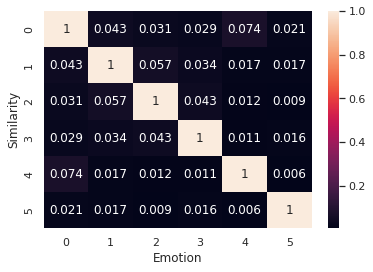

In [157]:
ax = sns.heatmap(z,annot=True) 
plt.xlabel('Emotion') 
plt.ylabel('Similarity')

#### Conclusion: From the above heatmap, we can understand that there is no correlation between the emotions, so there are unique texts present in the dataset.

# Rule Based Matching

### Token Matching

In [158]:
from spacy.matcher import Matcher

In [159]:
# Create a matcher object

matcher_1=Matcher(nlp.vocab)

In [160]:
# Pattern: It is a list of dictionaries 

pattern_1=[{'text':'happy'}]
pattern_1

[{'text': 'happy'}]

In [161]:
# Adding pattern to the matcher object

matcher_1.add('Pattern_1',[pattern_1])

In [162]:
# Passing the doc 

match_1=matcher_1(joy_doc)

In [163]:
print(len(match_1))

125


In [164]:
for match_id,start,end in match_1:
    span=joy_doc[start:end]
    print(span.text)

happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy
happy


In [165]:
matcher_2=Matcher(nlp.vocab)
pattern_2=[{'LEMMA':
            {'IN':['happy', 'excited', 'thrilled', 'content', 'satisfied']}}]

In [166]:
matcher_2.add('Pattern2',[pattern_2])
match_2=matcher_2(joy_doc)

In [167]:
print(len(match_2))

362


In [168]:
for match_id,start,end in match_2:
    span=joy_doc[start:end]
    print(span)

content
happy
excited
excited
happy
content
happy
happy
thrilled
happy
happy
excited
happier
satisfied
happy
happy
happy
content
satisfied
happy
thrilled
thrilled
happy
happy
happy
excited
happy
thrilled
happy
happy
happy
happy
excited
excited
happy
satisfied
happy
excited
excited
happy
excited
excited
happy
satisfied
satisfied
happy
happy
happy
happy
satisfied
satisfied
satisfied
happy
happy
satisfied
happy
satisfied
content
excited
excited
happy
happy
content
excited
content
satisfied
excited
happy
excited
content
happy
satisfied
excited
content
satisfied
content
excited
happy
thrilled
content
happy
excited
satisfied
excited
content
excited
happy
satisfied
satisfied
excited
excited
content
satisfied
happy
content
excited
content
contented
satisfied
content
excited
happy
happier
satisfied
contented
excited
happy
excited
happy
happy
happy
happy
excited
excited
excited
content
excited
happy
content
content
thrilled
excited
content
excited
content
happy
happy
happy
excited
satisfied
happ

## NER

In [169]:
from collections import Counter

In [170]:
for ent in joy_doc.ents:     
    print(ent.text, '==>', ent.label_)

petronas ==> PERSON
years ==> DATE
petronas ==> PERSON
christmas ==> DATE
two ==> CARDINAL
the days ==> DATE
don ==> PERSON
sam ==> PERSON
qaf ==> PERSON
feelin ==> CARDINAL
kayle ==> PERSON
one ==> CARDINAL
the start of december ==> DATE
today ==> DATE
friday ==> DATE
three ==> CARDINAL
spanish ==> LANGUAGE
all year ==> DATE
second ==> ORDINAL
london ==> GPE
fed ==> ORG
first ==> ORDINAL
second ==> ORDINAL
joseph ==> PERSON
six months ==> DATE
first ==> ORDINAL
that afternoon ==> TIME
li ==> PERSON
tomorrow ==> DATE
the last two years ==> DATE
first ==> ORDINAL
this quarter ==> DATE
first ==> ORDINAL
this weekend ==> DATE
this year ==> DATE
second ==> ORDINAL
first ==> ORDINAL
morris ==> PERSON
as i wrap week ==> DATE
some bad days ==> DATE
that night ==> TIME
the next morning ==> TIME
the weeks ==> DATE
years ==> DATE
the morning ==> TIME
about a month ==> DATE
halloween ==> DATE
one ==> CARDINAL
modern day ==> DATE
every morning ==> TIME
one ==> CARDINAL
daily ==> DATE
tonight ==> T

In [171]:
for ent in anger_doc.ents:     
    print(ent.text, '==>', ent.label_)

kinda ==> PERSON
the day ==> DATE
christmas ==> DATE
today ==> DATE
the entire day ==> DATE
first ==> ORDINAL
a year ==> DATE
this morning ==> TIME
virginia ==> GPE
florida ==> GPE
this whole week ==> DATE
today ==> DATE
that day ==> DATE
second ==> ORDINAL
this summer ==> DATE
today ==> DATE
this week ==> DATE
nine year old ==> DATE
a thousand ==> CARDINAL
today ==> DATE
this morning ==> TIME
every night ==> TIME
zero ==> CARDINAL
jeanette winterson ==> PERSON
wednesday ==> DATE
evening ==> TIME
fuckin chill ==> PERSON
an entire extra year ==> DATE
english ==> LANGUAGE
one ==> CARDINAL
fifteen feet ==> QUANTITY
these days ==> DATE
next week ==> DATE
un ==> ORG
only years old ==> DATE
weeks ==> DATE
the next minute ==> TIME
hu jia ==> PERSON
today ==> DATE
vista ==> ORG
tonight ==> TIME
britain ==> GPE
louis xvi ==> PERSON
marie ==> PERSON
russia ==> GPE
a week ==> DATE
years ==> DATE
today ==> DATE
my years ==> DATE
lee ==> PERSON
the morning ==> TIME
the end of the week ==> DATE
thre

In [172]:
for ent in sad_doc.ents:     
    print(ent.text, '==>', ent.label_)

the sixties ==> DATE
peter ==> PERSON
this year ==> DATE
chris ==> PERSON
five ==> CARDINAL
kinda ==> PERSON
ratty jeans ==> PERSON
first ==> ORDINAL
first ==> ORDINAL
third ==> ORDINAL
earlier today ==> TIME
matt ==> PERSON
a few miles ==> QUANTITY
last year ==> DATE
three ==> CARDINAL
amsterdam ==> GPE
american ==> NORP
amsterdam ==> GPE
the day ==> DATE
five or so months ==> DATE
years ago ==> DATE
this morning ==> TIME
the year ==> DATE
many days ==> DATE
today ==> DATE
one ==> CARDINAL
steve ==> PERSON
friday ==> DATE
at least minutes ==> TIME
merican ==> NORP
kamiki kun ==> PERSON
one ==> CARDINAL
one ==> CARDINAL
today ==> DATE
sunday ==> DATE
several hours ==> TIME
last year ==> DATE
one ==> CARDINAL
grammar ==> GPE
half ==> CARDINAL
next day ==> DATE
few days ==> DATE
zero ==> CARDINAL
tomorrow ==> DATE
bryan ==> PERSON
another sleepless night ==> TIME
twelve months ==> DATE
a gorgeous day ==> DATE
hours ==> TIME
today ==> DATE
more than one day ==> DATE
rel bookmark ==> PERSO

In [173]:
for ent in love_doc.ents:     
    print(ent.text, '==>', ent.label_)

first ==> ORDINAL
those short few months ==> DATE
third ==> ORDINAL
five hours ==> TIME
kerry ==> PERSON
second ==> ORDINAL
yesterday ==> DATE
nineteen year old ==> DATE
second ==> ORDINAL
uk ==> GPE
one ==> CARDINAL
george w ==> PERSON
all afternoon ==> TIME
one ==> CARDINAL
lucy ==> PERSON
leonard cohen ==> PERSON
christmas ==> DATE
first ==> ORDINAL
today ==> DATE
half ==> CARDINAL
daily ==> DATE
almost two decades ==> DATE
that morning ==> TIME
today ==> DATE
about minutes ==> TIME
yesterday ==> DATE
first ==> ORDINAL
one ==> CARDINAL
tomorrow ==> DATE
the days ==> DATE
years ==> DATE
that day ==> DATE
last year ==> DATE
the week ==> DATE
october ==> DATE
angsty ==> PRODUCT
first ==> ORDINAL
two ==> CARDINAL
this year ==> DATE
california ==> GPE
this year ==> DATE
year olds ==> DATE
naughty year olds ==> DATE
jesus ==> PERSON
heartsick ==> PERSON
a year ==> DATE
first ==> ORDINAL
clara ==> PERSON
today through april ==> DATE
wednesday ==> DATE
last night ==> TIME
one ==> CARDINAL
t

In [174]:
for ent in surprise_doc.ents:     
    print(ent.text, '==>', ent.label_)

the past couple of days ==> DATE
week ==> DATE
friday ==> DATE
wednesday ==> DATE
one ==> CARDINAL
klein ==> GPE
thousand ==> CARDINAL
mccarthy ==> PERSON
california ==> GPE
these and year olds ==> DATE
about a month ==> DATE
months ==> DATE
hours ==> TIME
a few days ==> DATE
mike ==> PERSON
kinda ==> PERSON
lil wayne nikki minaj ==> ORG
gracias ==> ORDINAL
second ==> ORDINAL
twenty five ==> CARDINAL
last year ==> DATE
darren ==> PERSON
year ==> DATE
this weekend ==> DATE
nearly years ==> DATE
only one ==> CARDINAL
four ==> CARDINAL
today ==> DATE
yesterday ==> DATE
tonight ==> TIME
daily ==> DATE
years ==> DATE
four ==> CARDINAL
thousands of miles ==> QUANTITY
an entire year ==> DATE
the other day ==> DATE
today ==> DATE
this morning ==> TIME
today ==> DATE
bush ==> PERSON
every night ==> TIME
steve ==> PERSON
one ==> CARDINAL
kenny ==> PERSON
three ==> CARDINAL
yesterday ==> DATE
jesse ==> PERSON
today ==> DATE
one ==> CARDINAL
today ==> DATE
new zealand ==> GPE
yesterday ==> DATE
re

In [175]:
for ent in fear_doc.ents:     
    print(ent.text, '==>', ent.label_)

two ==> CARDINAL
five ==> CARDINAL
a few days ==> DATE
the last few months ==> DATE
brazil ==> GPE
one day ==> DATE
two ==> CARDINAL
tomorrow ==> DATE
monday ==> DATE
london ==> GPE
first ==> ORDINAL
years ==> DATE
weeks ago ==> DATE
finland ==> GPE
paris ==> GPE
st grade ==> GPE
janne suominen ==> PERSON
huckleberry finn ==> PERSON
lorena ==> GPE
georgia ==> GPE
every night ==> TIME
last week ==> DATE
arabs ==> NORP
doha ==> GPE
america ==> GPE
tonight ==> TIME
sunday ==> DATE
morning ==> TIME
scott dale ==> PERSON
around pm ==> TIME
two ==> CARDINAL
today ==> DATE
first ==> ORDINAL
two ==> CARDINAL
tonight ==> TIME
english ==> LANGUAGE
barely twenty four hours ==> TIME
eighteen ==> DATE
today ==> DATE
hours ==> TIME
today ==> DATE
each week ==> DATE
a few minutes ==> TIME
don ==> PERSON
next week ==> DATE
a million ==> CARDINAL
three ==> CARDINAL
four ==> CARDINAL
these days ==> DATE
today ==> DATE
asian ==> NORP
tuesday ==> DATE
today ==> DATE
two ==> CARDINAL
this month ==> DATE
th

In [176]:
ent_list_joy=[]
for ent in joy_doc.ents:
    ent_list_joy.append(ent.label_)
print(ent_list_joy)

['PERSON', 'DATE', 'PERSON', 'DATE', 'CARDINAL', 'DATE', 'PERSON', 'PERSON', 'PERSON', 'CARDINAL', 'PERSON', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'CARDINAL', 'LANGUAGE', 'DATE', 'ORDINAL', 'GPE', 'ORG', 'ORDINAL', 'ORDINAL', 'PERSON', 'DATE', 'ORDINAL', 'TIME', 'PERSON', 'DATE', 'DATE', 'ORDINAL', 'DATE', 'ORDINAL', 'DATE', 'DATE', 'ORDINAL', 'ORDINAL', 'PERSON', 'DATE', 'DATE', 'TIME', 'TIME', 'DATE', 'DATE', 'TIME', 'DATE', 'DATE', 'CARDINAL', 'DATE', 'TIME', 'CARDINAL', 'DATE', 'TIME', 'PERSON', 'DATE', 'NORP', 'TIME', 'TIME', 'DATE', 'DATE', 'DATE', 'PERSON', 'DATE', 'GPE', 'CARDINAL', 'DATE', 'DATE', 'GPE', 'CARDINAL', 'NORP', 'TIME', 'DATE', 'DATE', 'PERSON', 'ORG', 'PRODUCT', 'PERSON', 'DATE', 'DATE', 'GPE', 'NORP', 'TIME', 'DATE', 'DATE', 'DATE', 'ORDINAL', 'PERSON', 'ORDINAL', 'ORDINAL', 'QUANTITY', 'DATE', 'DATE', 'ORDINAL', 'GPE', 'DATE', 'DATE', 'DATE', 'PERSON', 'CARDINAL', 'DATE', 'DATE', 'ORDINAL', 'PERSON', 'DATE', 'CARDINAL', 'DATE', 'PERSON', 'DATE', 'CARDINAL', 'CARDI

In [177]:
Counter(ent_list_joy)

Counter({'PERSON': 123,
         'DATE': 556,
         'CARDINAL': 131,
         'LANGUAGE': 6,
         'ORDINAL': 84,
         'GPE': 66,
         'ORG': 47,
         'TIME': 147,
         'NORP': 44,
         'PRODUCT': 3,
         'QUANTITY': 6,
         'LOC': 4,
         'FAC': 3,
         'MONEY': 4})

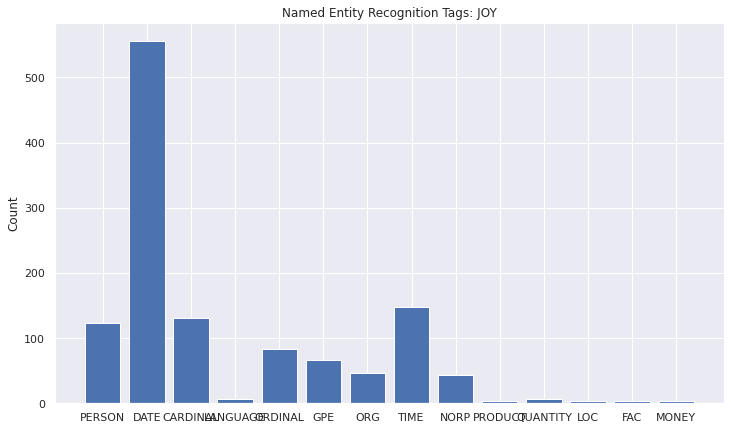

In [178]:
plt.figure(figsize=(12,7))
plt.bar(range(len(Counter(ent_list_joy))), list(Counter(ent_list_joy).values()), align='center')
plt.xticks(range(len(Counter(ent_list_joy))), list(Counter(ent_list_joy).keys()))
plt.ylabel('Count')
plt.title('Named Entity Recognition Tags: JOY')

plt.show()

In [179]:
ent_list_anger=[]
for ent in anger_doc.ents:
    ent_list_anger.append(ent.label_)
print(ent_list_anger)

['PERSON', 'DATE', 'DATE', 'DATE', 'DATE', 'ORDINAL', 'DATE', 'TIME', 'GPE', 'GPE', 'DATE', 'DATE', 'DATE', 'ORDINAL', 'DATE', 'DATE', 'DATE', 'DATE', 'CARDINAL', 'DATE', 'TIME', 'TIME', 'CARDINAL', 'PERSON', 'DATE', 'TIME', 'PERSON', 'DATE', 'LANGUAGE', 'CARDINAL', 'QUANTITY', 'DATE', 'DATE', 'ORG', 'DATE', 'DATE', 'TIME', 'PERSON', 'DATE', 'ORG', 'TIME', 'GPE', 'PERSON', 'PERSON', 'GPE', 'DATE', 'DATE', 'DATE', 'DATE', 'PERSON', 'TIME', 'DATE', 'CARDINAL', 'CARDINAL', 'DATE', 'GPE', 'DATE', 'DATE', 'ORG', 'DATE', 'DATE', 'DATE', 'PERSON', 'ORDINAL', 'DATE', 'ORDINAL', 'DATE', 'PERSON', 'PERSON', 'DATE', 'DATE', 'TIME', 'DATE', 'DATE', 'CARDINAL', 'TIME', 'CARDINAL', 'DATE', 'TIME', 'NORP', 'NORP', 'TIME', 'DATE', 'ORDINAL', 'DATE', 'CARDINAL', 'TIME', 'TIME', 'ORDINAL', 'TIME', 'CARDINAL', 'DATE', 'ORG', 'TIME', 'GPE', 'DATE', 'CARDINAL', 'CARDINAL', 'DATE', 'CARDINAL', 'DATE', 'PERSON', 'CARDINAL', 'ORG', 'DATE', 'ORDINAL', 'DATE', 'DATE', 'CARDINAL', 'NORP', 'DATE', 'CARDINAL', 'DA

In [180]:
Counter(ent_list_anger)

Counter({'PERSON': 44,
         'DATE': 177,
         'ORDINAL': 24,
         'TIME': 43,
         'GPE': 27,
         'CARDINAL': 48,
         'LANGUAGE': 1,
         'QUANTITY': 1,
         'ORG': 12,
         'NORP': 11})

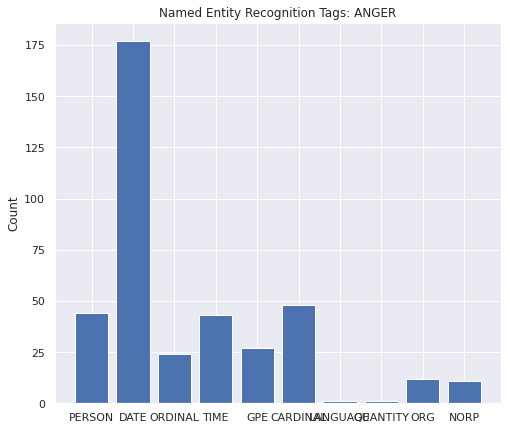

In [181]:
plt.figure(figsize=(8,7))
plt.bar(range(len(Counter(ent_list_anger))), list(Counter(ent_list_anger).values()), align='center')
plt.xticks(range(len(Counter(ent_list_anger))), list(Counter(ent_list_anger).keys()))
plt.ylabel('Count')
plt.title('Named Entity Recognition Tags: ANGER')

plt.show()

In [182]:
ent_list_sad=[]
for ent in sad_doc.ents:
    ent_list_sad.append(ent.label_)
print(ent_list_sad)

['DATE', 'PERSON', 'DATE', 'PERSON', 'CARDINAL', 'PERSON', 'PERSON', 'ORDINAL', 'ORDINAL', 'ORDINAL', 'TIME', 'PERSON', 'QUANTITY', 'DATE', 'CARDINAL', 'GPE', 'NORP', 'GPE', 'DATE', 'DATE', 'DATE', 'TIME', 'DATE', 'DATE', 'DATE', 'CARDINAL', 'PERSON', 'DATE', 'TIME', 'NORP', 'PERSON', 'CARDINAL', 'CARDINAL', 'DATE', 'DATE', 'TIME', 'DATE', 'CARDINAL', 'GPE', 'CARDINAL', 'DATE', 'DATE', 'CARDINAL', 'DATE', 'PERSON', 'TIME', 'DATE', 'DATE', 'TIME', 'DATE', 'DATE', 'PERSON', 'DATE', 'TIME', 'DATE', 'TIME', 'PERSON', 'DATE', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'CARDINAL', 'CARDINAL', 'PERSON', 'TIME', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'DATE', 'PERSON', 'DATE', 'DATE', 'ORDINAL', 'DATE', 'DATE', 'CARDINAL', 'TIME', 'PERSON', 'CARDINAL', 'DATE', 'DATE', 'CARDINAL', 'TIME', 'DATE', 'TIME', 'DATE', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'ORDINAL', 'DATE', 'DATE', 'PERSON', 'PERSON

In [183]:
Counter(ent_list_sad)

Counter({'DATE': 493,
         'PERSON': 115,
         'CARDINAL': 89,
         'ORDINAL': 42,
         'TIME': 111,
         'QUANTITY': 6,
         'GPE': 62,
         'NORP': 39,
         'FAC': 1,
         'LOC': 1,
         'ORG': 19,
         'MONEY': 1,
         'PRODUCT': 1,
         'EVENT': 1})

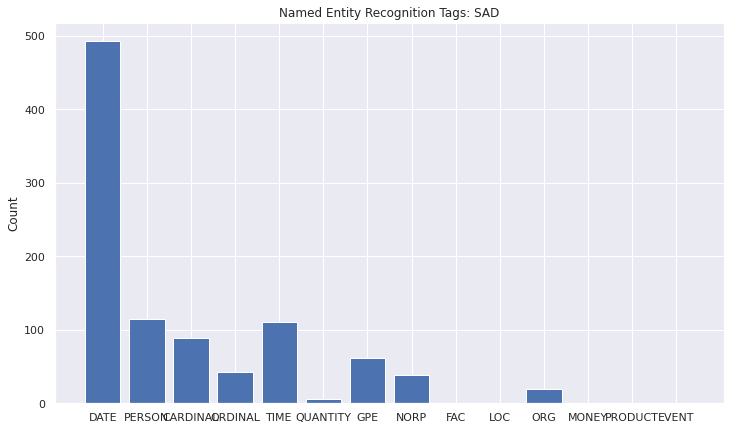

In [184]:
plt.figure(figsize=(12,7))
plt.bar(range(len(Counter(ent_list_sad))), list(Counter(ent_list_sad).values()), align='center')
plt.xticks(range(len(Counter(ent_list_sad))), list(Counter(ent_list_sad).keys()))
plt.ylabel('Count')
plt.title('Named Entity Recognition Tags: SAD')

plt.show()

In [185]:
ent_list_love=[]
for ent in love_doc.ents:
    ent_list_love.append(ent.label_)
print(ent_list_love)

['ORDINAL', 'DATE', 'ORDINAL', 'TIME', 'PERSON', 'ORDINAL', 'DATE', 'DATE', 'ORDINAL', 'GPE', 'CARDINAL', 'PERSON', 'TIME', 'CARDINAL', 'PERSON', 'PERSON', 'DATE', 'ORDINAL', 'DATE', 'CARDINAL', 'DATE', 'DATE', 'TIME', 'DATE', 'TIME', 'DATE', 'ORDINAL', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'PRODUCT', 'ORDINAL', 'CARDINAL', 'DATE', 'GPE', 'DATE', 'DATE', 'DATE', 'PERSON', 'PERSON', 'DATE', 'ORDINAL', 'PERSON', 'DATE', 'DATE', 'TIME', 'CARDINAL', 'TIME', 'CARDINAL', 'DATE', 'CARDINAL', 'ORG', 'ORG', 'PERSON', 'DATE', 'DATE', 'PERSON', 'ORDINAL', 'TIME', 'CARDINAL', 'TIME', 'GPE', 'DATE', 'GPE', 'PERSON', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'ORG', 'DATE', 'TIME', 'CARDINAL', 'ORDINAL', 'GPE', 'TIME', 'DATE', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'PERSON', 'PERSON', 'DATE', 'TIME', 'DATE', 'DATE', 'DATE', 'ORDINAL', 'DATE', 'DATE', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'PERSON', 'PERSON', 'DATE', 'CARDINAL', 'ORDINAL', 'DATE', 'DATE', 'GPE', 'TIME', 'ORDINAL', 'L

In [186]:
Counter(ent_list_love)

Counter({'ORDINAL': 23,
         'DATE': 100,
         'TIME': 30,
         'PERSON': 42,
         'GPE': 18,
         'CARDINAL': 33,
         'PRODUCT': 1,
         'ORG': 8,
         'LOC': 1,
         'NORP': 4,
         'FAC': 1})

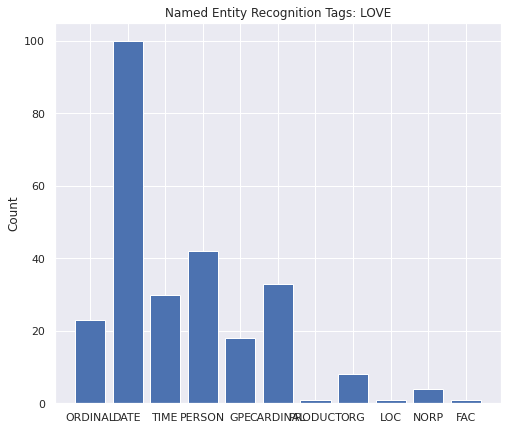

In [187]:
plt.figure(figsize=(8,7))
plt.bar(range(len(Counter(ent_list_love))), list(Counter(ent_list_love).values()), align='center')
plt.xticks(range(len(Counter(ent_list_love))), list(Counter(ent_list_love).keys()))
plt.ylabel('Count')
plt.title('Named Entity Recognition Tags: LOVE')

plt.show()

In [188]:
ent_list_surprise=[]
for ent in surprise_doc.ents:
    ent_list_surprise.append(ent.label_)
print(ent_list_surprise)

['DATE', 'DATE', 'DATE', 'DATE', 'CARDINAL', 'GPE', 'CARDINAL', 'PERSON', 'GPE', 'DATE', 'DATE', 'DATE', 'TIME', 'DATE', 'PERSON', 'PERSON', 'ORG', 'ORDINAL', 'ORDINAL', 'CARDINAL', 'DATE', 'PERSON', 'DATE', 'DATE', 'DATE', 'CARDINAL', 'CARDINAL', 'DATE', 'DATE', 'TIME', 'DATE', 'DATE', 'CARDINAL', 'QUANTITY', 'DATE', 'DATE', 'DATE', 'TIME', 'DATE', 'PERSON', 'TIME', 'PERSON', 'CARDINAL', 'PERSON', 'CARDINAL', 'DATE', 'PERSON', 'DATE', 'CARDINAL', 'DATE', 'GPE', 'DATE', 'PERSON', 'DATE', 'PERSON', 'ORG', 'TIME', 'DATE', 'CARDINAL', 'DATE', 'TIME', 'CARDINAL', 'NORP', 'NORP', 'PERSON', 'GPE', 'DATE', 'DATE', 'TIME', 'DATE', 'CARDINAL', 'ORDINAL', 'DATE', 'DATE', 'TIME', 'CARDINAL', 'DATE', 'TIME', 'GPE', 'ORG', 'PERSON', 'DATE', 'ORG', 'PERSON', 'DATE', 'DATE', 'ORG', 'DATE', 'PERSON', 'ORG', 'DATE', 'TIME', 'DATE', 'LOC', 'PERSON', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'DATE', 'CARDINAL', 'ORDINAL', 'PERSON', 'GPE', 'TIME', 'TIME', 'TIME', 'DATE', 'CARDINAL', 'DATE', 'DATE', 'GPE', 'DATE

In [189]:
Counter(ent_list_surprise)

Counter({'DATE': 49,
         'CARDINAL': 20,
         'GPE': 8,
         'PERSON': 19,
         'TIME': 16,
         'ORG': 6,
         'ORDINAL': 6,
         'QUANTITY': 1,
         'NORP': 2,
         'LOC': 1})

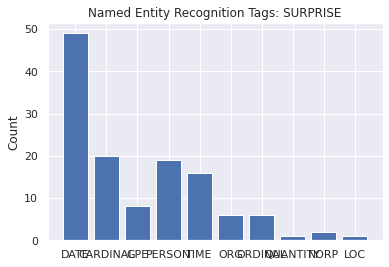

In [190]:
plt.bar(range(len(Counter(ent_list_surprise))), list(Counter(ent_list_surprise).values()), align='center')
plt.xticks(range(len(Counter(ent_list_surprise))), list(Counter(ent_list_surprise).keys()))
plt.ylabel('Count')
plt.title('Named Entity Recognition Tags: SURPRISE')

plt.show()

In [191]:
ent_list_fear=[]
for ent in fear_doc.ents:
    ent_list_fear.append(ent.label_)
print(ent_list_fear)

['CARDINAL', 'CARDINAL', 'DATE', 'DATE', 'GPE', 'DATE', 'CARDINAL', 'DATE', 'DATE', 'GPE', 'ORDINAL', 'DATE', 'DATE', 'GPE', 'GPE', 'GPE', 'PERSON', 'PERSON', 'GPE', 'GPE', 'TIME', 'DATE', 'NORP', 'GPE', 'GPE', 'TIME', 'DATE', 'TIME', 'PERSON', 'TIME', 'CARDINAL', 'DATE', 'ORDINAL', 'CARDINAL', 'TIME', 'LANGUAGE', 'TIME', 'DATE', 'DATE', 'TIME', 'DATE', 'DATE', 'TIME', 'PERSON', 'DATE', 'CARDINAL', 'CARDINAL', 'CARDINAL', 'DATE', 'DATE', 'NORP', 'DATE', 'DATE', 'CARDINAL', 'DATE', 'CARDINAL', 'DATE', 'CARDINAL', 'DATE', 'DATE', 'TIME', 'TIME', 'PERSON', 'CARDINAL', 'TIME', 'DATE', 'TIME', 'DATE', 'TIME', 'TIME', 'DATE', 'TIME', 'PERSON', 'DATE', 'DATE', 'DATE', 'TIME', 'DATE', 'DATE', 'TIME', 'ORDINAL', 'DATE', 'CARDINAL', 'DATE', 'GPE', 'DATE', 'DATE', 'TIME', 'DATE', 'TIME', 'GPE', 'CARDINAL', 'TIME', 'CARDINAL', 'DATE', 'GPE', 'LANGUAGE', 'TIME', 'PERSON', 'ORG', 'TIME', 'ORDINAL', 'DATE', 'DATE', 'DATE', 'TIME', 'GPE', 'GPE', 'ORG', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', '

In [192]:
Counter(ent_list_fear)

Counter({'CARDINAL': 46,
         'DATE': 127,
         'GPE': 29,
         'ORDINAL': 15,
         'PERSON': 27,
         'TIME': 41,
         'NORP': 12,
         'LANGUAGE': 3,
         'ORG': 8,
         'LOC': 2,
         'MONEY': 1})

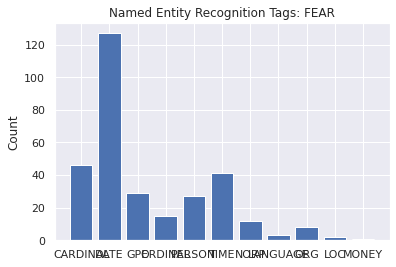

In [193]:
plt.bar(range(len(Counter(ent_list_fear))), list(Counter(ent_list_fear).values()), align='center')
plt.xticks(range(len(Counter(ent_list_fear))), list(Counter(ent_list_fear).keys()))
plt.ylabel('Count')
plt.title('Named Entity Recognition Tags: FEAR')

plt.show()

In [194]:
ent_list=[]
for ent in doc.ents:
    ent_list.append(ent.label_)
print(ent_list)

['PERSON', 'DATE', 'PERSON', 'DATE', 'CARDINAL', 'CARDINAL', 'PERSON', 'DATE', 'DATE', 'DATE', 'DATE', 'DATE', 'CARDINAL', 'DATE', 'PERSON', 'DATE', 'PERSON', 'PERSON', 'ORDINAL', 'PERSON', 'CARDINAL', 'PERSON', 'DATE', 'PERSON', 'CARDINAL', 'DATE', 'DATE', 'DATE', 'CARDINAL', 'ORDINAL', 'DATE', 'DATE', 'PERSON', 'DATE', 'PERSON', 'DATE', 'CARDINAL', 'TIME', 'DATE', 'DATE', 'ORDINAL', 'LANGUAGE', 'GPE', 'DATE', 'ORDINAL', 'ORDINAL', 'CARDINAL', 'TIME', 'PERSON', 'QUANTITY', 'DATE', 'CARDINAL', 'DATE', 'DATE', 'ORDINAL', 'GPE', 'NORP', 'GPE', 'GPE', 'CARDINAL', 'ORG', 'DATE', 'DATE', 'ORDINAL', 'TIME', 'ORDINAL', 'ORDINAL', 'DATE', 'DATE', 'DATE', 'TIME', 'DATE', 'PERSON', 'DATE', 'ORDINAL', 'GPE', 'PERSON', 'DATE', 'GPE', 'TIME', 'PERSON', 'ORDINAL', 'DATE', 'CARDINAL', 'DATE', 'PERSON', 'DATE', 'DATE', 'ORDINAL', 'ORDINAL', 'DATE', 'CARDINAL', 'GPE', 'GPE', 'ORDINAL', 'DATE', 'GPE', 'GPE', 'GPE', 'PERSON', 'DATE', 'DATE', 'DATE', 'TIME', 'NORP', 'ORDINAL', 'PERSON', 'PERSON', 'ORDINAL

In [195]:
Counter(ent_list)

Counter({'PERSON': 364,
         'DATE': 1498,
         'CARDINAL': 364,
         'ORDINAL': 194,
         'TIME': 389,
         'LANGUAGE': 10,
         'GPE': 210,
         'QUANTITY': 14,
         'NORP': 112,
         'ORG': 102,
         'PRODUCT': 5,
         'FAC': 5,
         'LOC': 9,
         'MONEY': 5,
         'EVENT': 1})

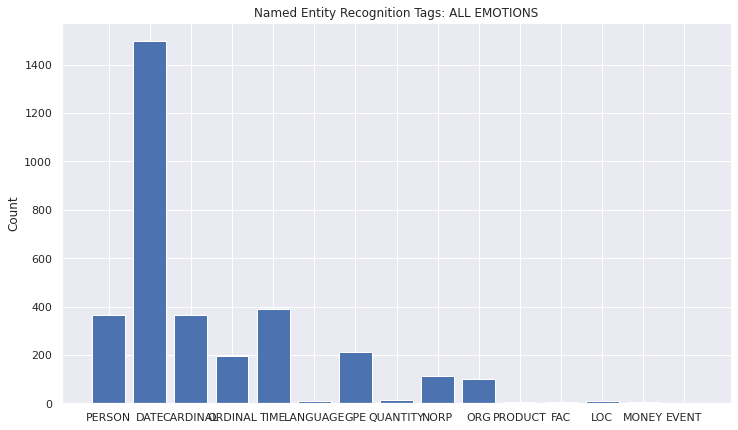

In [196]:
plt.figure(figsize=(12,7))
plt.bar(range(len(Counter(ent_list))), list(Counter(ent_list).values()), align='center')
plt.xticks(range(len(Counter(ent_list))), list(Counter(ent_list).keys()))
plt.ylabel('Count')
plt.title('Named Entity Recognition Tags: ALL EMOTIONS')

plt.show()

## Building a Model

In [197]:
from sklearn.model_selection import train_test_split

In [198]:
X_train, X_test, y_train, y_test = train_test_split(emotions["Text"], emotions["emotion"],
                                                    test_size=0.2, random_state=100)

In [199]:
X_train

6911     i feel is probably the most acceptable strateg...
10070    i thought i hope our vanquished england failur...
2556     im not sure that feeling slightly wronged by t...
8272     i feel very reluctant to blog during my free p...
3379              i reply because they make me feel pretty
                               ...                        
79                                i feel angered and firey
12119    i said those who feel unhappy with the way uhu...
8039     i could feel my body start to shake with nervo...
6936     i cant tell you the joy i was feeling as i hel...
5640     i get the feeling they genuinely liked being o...
Name: Text, Length: 11200, dtype: object

In [200]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [201]:
cv = CountVectorizer()
X_train_cv = cv.fit_transform(X_train)
X_test_cv = cv.transform(X_test)

In [202]:
print(X_train_cv)

  (0, 4120)	1
  (0, 5871)	2
  (0, 8645)	1
  (0, 11248)	2
  (0, 7217)	1
  (0, 54)	1
  (0, 10707)	1
  (0, 11415)	2
  (0, 4213)	1
  (0, 7839)	1
  (0, 5233)	2
  (0, 8048)	2
  (0, 5892)	2
  (0, 3221)	1
  (0, 7578)	1
  (0, 5527)	1
  (0, 1528)	1
  (0, 491)	1
  (0, 6903)	1
  (0, 11243)	1
  (0, 7758)	1
  (0, 7002)	1
  (0, 10773)	1
  (0, 12283)	1
  (0, 7333)	1
  :	:
  (11198, 11248)	1
  (11198, 4124)	1
  (11198, 7337)	1
  (11198, 12672)	1
  (11198, 7604)	1
  (11198, 1557)	1
  (11198, 1589)	1
  (11198, 12254)	1
  (11198, 628)	1
  (11198, 10362)	1
  (11198, 6035)	1
  (11198, 11164)	1
  (11198, 5148)	1
  (11199, 11248)	2
  (11199, 7839)	1
  (11199, 421)	1
  (11199, 4124)	1
  (11199, 11279)	1
  (11199, 4669)	1
  (11199, 1013)	1
  (11199, 5171)	1
  (11199, 6466)	1
  (11199, 8316)	1
  (11199, 542)	1
  (11199, 4656)	1


In [203]:
print(X_test_cv)

  (0, 1513)	1
  (0, 3634)	1
  (0, 4124)	1
  (0, 4383)	1
  (0, 4754)	1
  (0, 5871)	1
  (0, 6304)	1
  (0, 7092)	1
  (0, 9016)	1
  (0, 9692)	1
  (0, 10344)	1
  (0, 11415)	1
  (0, 11935)	1
  (0, 12326)	1
  (1, 421)	2
  (1, 4124)	1
  (1, 4212)	1
  (1, 6292)	1
  (1, 6463)	1
  (1, 7159)	1
  (1, 7198)	2
  (1, 7342)	1
  (1, 9975)	1
  (1, 12428)	1
  (2, 421)	1
  :	:
  (2797, 6895)	1
  (2797, 7337)	1
  (2797, 7455)	1
  (2797, 9782)	1
  (2797, 10036)	1
  (2797, 10037)	1
  (2797, 10123)	1
  (2797, 11243)	1
  (2797, 11261)	1
  (2797, 11310)	1
  (2798, 26)	1
  (2798, 421)	1
  (2798, 489)	1
  (2798, 4124)	1
  (2798, 5892)	1
  (2798, 6293)	1
  (2798, 11313)	1
  (2798, 12553)	1
  (2799, 593)	1
  (2799, 4124)	1
  (2799, 8316)	1
  (2799, 8349)	1
  (2799, 10292)	1
  (2799, 11248)	1
  (2799, 12254)	1


In [204]:
y_train

6911         joy
10070      anger
2556       anger
8272        fear
3379         joy
          ...   
79         anger
12119    sadness
8039        fear
6936         joy
5640        love
Name: emotion, Length: 11200, dtype: object

In [205]:
y_test

6309     sadness
10972    sadness
6714        fear
1140        fear
6225       anger
          ...   
9855     sadness
6968         joy
10124       fear
2330        fear
3707         joy
Name: emotion, Length: 2800, dtype: object

In [206]:
from sklearn.ensemble import RandomForestClassifier

In [207]:
rf = RandomForestClassifier(n_estimators=100, random_state=100)
rf.fit(X_train_cv, y_train)

RandomForestClassifier(random_state=100)

In [208]:
y_pred_rf = rf.predict(X_test_cv)

In [209]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [210]:
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Accuracy of Random Forest classifier:", accuracy_rf)

Accuracy of Random Forest classifier: 0.8689285714285714


In [211]:
report_rf = classification_report(y_test, y_pred_rf)
print("Classification report of Random Forest classifier:\n", report_rf)

Classification report of Random Forest classifier:
               precision    recall  f1-score   support

       anger       0.88      0.80      0.84       355
        fear       0.84      0.79      0.81       352
         joy       0.85      0.95      0.90       952
        love       0.83      0.70      0.76       209
     sadness       0.92      0.91      0.91       826
    surprise       0.77      0.73      0.75       106

    accuracy                           0.87      2800
   macro avg       0.85      0.81      0.83      2800
weighted avg       0.87      0.87      0.87      2800



In [212]:
y_pred_rf

array(['sadness', 'sadness', 'fear', ..., 'fear', 'fear', 'joy'],
      dtype=object)

In [213]:
from sklearn.linear_model import LogisticRegression

In [214]:
lr = LogisticRegression(max_iter=1000, random_state=100)
lr.fit(X_train_cv, y_train)

LogisticRegression(max_iter=1000, random_state=100)

In [215]:
y_pred_lr = lr.predict(X_test_cv)

In [216]:
report_lr = classification_report(y_test, y_pred_lr)
print("Classification report of Logistic Regression (Multi-Class):\n", report_lr)

Classification report of Logistic Regression (Multi-Class):
               precision    recall  f1-score   support

       anger       0.89      0.84      0.86       355
        fear       0.86      0.80      0.83       352
         joy       0.90      0.94      0.92       952
        love       0.78      0.73      0.75       209
     sadness       0.90      0.94      0.92       826
    surprise       0.80      0.65      0.72       106

    accuracy                           0.88      2800
   macro avg       0.86      0.82      0.83      2800
weighted avg       0.88      0.88      0.88      2800



In [217]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline

In [218]:
nb = MultinomialNB()
nb.fit(X_train_cv, y_train)

MultinomialNB()

In [219]:
y_pred_nb = nb.predict(X_test_cv)

In [220]:
report_nb = classification_report(y_test, y_pred_nb)
print("Classification report of Multinomial Naive Bayes:\n", report_nb)

Classification report of Multinomial Naive Bayes:
               precision    recall  f1-score   support

       anger       0.88      0.52      0.65       355
        fear       0.84      0.39      0.54       352
         joy       0.71      0.95      0.81       952
        love       0.93      0.19      0.32       209
     sadness       0.70      0.93      0.80       826
    surprise       1.00      0.01      0.02       106

    accuracy                           0.73      2800
   macro avg       0.84      0.50      0.52      2800
weighted avg       0.77      0.73      0.69      2800



In [221]:
from sklearn.svm import LinearSVC

In [222]:
svm = LinearSVC(random_state=100)
svm.fit(X_train_cv, y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


LinearSVC(random_state=100)

In [223]:
y_pred_svm = svm.predict(X_test_cv)

In [224]:
report_svm = classification_report(y_test, y_pred_svm)
print("Classification report of Linear SVM:\n", report_svm)

Classification report of Linear SVM:
               precision    recall  f1-score   support

       anger       0.88      0.85      0.87       355
        fear       0.85      0.82      0.84       352
         joy       0.91      0.92      0.91       952
        love       0.77      0.76      0.76       209
     sadness       0.90      0.93      0.92       826
    surprise       0.81      0.71      0.75       106

    accuracy                           0.88      2800
   macro avg       0.85      0.83      0.84      2800
weighted avg       0.88      0.88      0.88      2800



In [225]:
data.shape

(14000,)

##### Converting words to TFIDF vectors

In [226]:
from sklearn.feature_extraction.text import TfidfVectorizer

tf=TfidfVectorizer()

features=tf.fit_transform(data)

In [227]:
features

<14000x14190 sparse matrix of type '<class 'numpy.float64'>'
	with 218705 stored elements in Compressed Sparse Row format>

In [228]:
print(features)

  (0, 6021)	0.7903289388707286
  (0, 4623)	0.16347761430640476
  (0, 3381)	0.5904703531966312
  (1, 868)	0.32539874404595115
  (1, 6565)	0.1327904536133618
  (1, 464)	0.07721498500152837
  (1, 1822)	0.3426308508021808
  (1, 13833)	0.1884093257494386
  (1, 11553)	0.22018654207865812
  (1, 657)	0.21015056621073572
  (1, 1110)	0.17900110024369267
  (1, 6791)	0.14813448254110542
  (1, 5937)	0.2819789700307482
  (1, 2992)	0.379837925941676
  (1, 12729)	0.08168055316142378
  (1, 5939)	0.27716254572024385
  (1, 11488)	0.25015148805127124
  (1, 4627)	0.09226766230462488
  (1, 5047)	0.35331139881033685
  (1, 5318)	0.20216738311555
  (1, 1755)	0.16409195440603172
  (2, 14050)	0.3942527695447893
  (2, 5431)	0.3974808410931715
  (2, 9476)	0.35934705832778885
  (2, 7905)	0.4560015001640319
  :	:
  (13999, 3737)	0.20567531597315028
  (13999, 1967)	0.19463141606688164
  (13999, 6409)	0.17530152581996253
  (13999, 1182)	0.14567727171545317
  (13999, 5613)	0.14295840449501448
  (13999, 12579)	0.1305855

# Clustering using KMeans

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


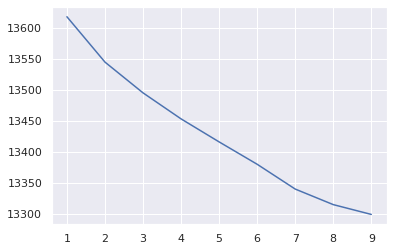

In [229]:
from sklearn.cluster import KMeans
SSD=[]
for k in range(1,10):
    kmeans=KMeans(n_clusters=k,random_state=10)
    kmeans.fit(features)
    SSD.append(kmeans.inertia_)
plt.plot(range(1,10),SSD);

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

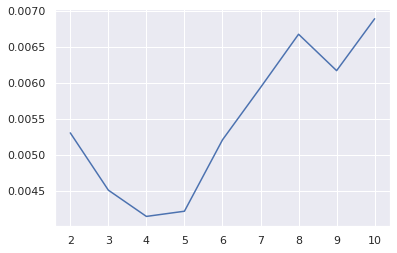

In [230]:
# Applying silhoutte score

from sklearn.metrics import silhouette_score
SS=[]
for k in range(2,11):
    kmeans=KMeans(n_clusters=k,random_state=10)
    kmeans.fit(features)
    SS.append(silhouette_score(features,kmeans.predict(features)))
plt.plot(range(2,11),SS)

# Building a clustering Model

In [231]:
kmeans=KMeans(n_clusters=5,random_state=10)
kmeans.fit(features)
kmeans.labels_

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([4, 2, 4, ..., 4, 4, 1], dtype=int32)

### Appending the DF

In [232]:
emotions['Cluster']=kmeans.labels_

<ipython-input-232-ce2a68f228c2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emotions['Cluster']=kmeans.labels_


In [233]:
emotions

,Text,emotion,text_tokens,encoded_label,Cluster
0,i didnt feel humiliated,sadness,"[i, did, nt, feel, humiliated]",4,4
1,i can go from feeling so hopeless to so damned...,sadness,"[i, can, go, from, feeling, so, hopeless, to, ...",4,2
2,im grabbing a minute to post i feel greedy wrong,anger,"[i, m, grabbing, a, minute, to, post, i, feel,...",0,4
3,i am ever feeling nostalgic about the fireplac...,love,"[i, am, ever, feeling, nostalgic, about, the, ...",3,3
4,i am feeling grouchy,anger,"[i, am, feeling, grouchy]",0,3
...,...,...,...,...,...
13995,i love those cars and i feel that my second at...,joy,"[i, love, those, cars, and, i, feel, that, my,...",2,4
13996,i feel anything for relationships the doomed one,sadness,"[i, feel, anything, for, relationships, the, d...",4,1
13997,i should just let him calm down on his own but...,sadness,"[i, should, just, let, him, calm, down, on, hi...",4,4
13998,when i saw a man hitting a child of years with...,anger,"[when, i, saw, a, man, hitting, a, child, of, ...",0,4


# TSNE

In [235]:
from sklearn.manifold import TSNE

In [236]:
tsne=TSNE(n_components=2,perplexity=30,init='random')

In [237]:
features_tsne=tsne.fit_transform(features)

In [238]:
print(features_tsne)

[[ 68.03104    -17.078714  ]
 [ -0.29059803 -42.047134  ]
 [ 14.323756   -33.969395  ]
 ...
 [-28.271044    28.840841  ]
 [  9.254658    54.670357  ]
 [ 36.2301      45.39646   ]]


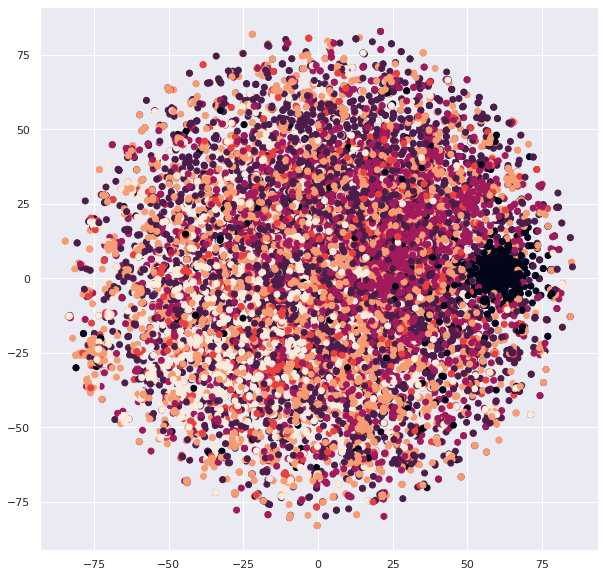

In [239]:
plt.figure(figsize=(10,10))
plt.scatter(features_tsne[:,0],features_tsne[:,1],c=emotions['Cluster'])

## Building a Text Classification Model

Extracting text data from the dataset to classify the text into different emotions

In [240]:
emotions['Text']

0                                  i didnt feel humiliated
1        i can go from feeling so hopeless to so damned...
2         im grabbing a minute to post i feel greedy wrong
3        i am ever feeling nostalgic about the fireplac...
4                                     i am feeling grouchy
                               ...                        
13995    i love those cars and i feel that my second at...
13996     i feel anything for relationships the doomed one
13997    i should just let him calm down on his own but...
13998    when i saw a man hitting a child of years with...
13999    i don t know if these children will fulfill th...
Name: Text, Length: 14000, dtype: object

In [241]:
emotions['emotion']

0        sadness
1        sadness
2          anger
3           love
4          anger
          ...   
13995        joy
13996    sadness
13997    sadness
13998      anger
13999    sadness
Name: emotion, Length: 14000, dtype: object

In [242]:
mnb=make_pipeline(TfidfVectorizer(),MultinomialNB())

In [243]:
##Training

mnb.fit(emotions['Text'], emotions['emotion'])

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('multinomialnb', MultinomialNB())])

In [244]:
emotion_test=pd.read_table("test.txt",delimiter=";",header=None,)

In [245]:
emotion_test.columns=['Text','emotion']

emotion_test=emotion_test.iloc[:1000]

In [246]:
emotion_test

,Text,emotion
0,im feeling rather rotten so im not very ambiti...,sadness
1,im updating my blog because i feel shitty,sadness
2,i never make her separate from me because i do...,sadness
3,i left with my bouquet of red and yellow tulip...,joy
4,i was feeling a little vain when i did this one,sadness
...,...,...
1995,i just keep feeling like someone is being unki...,anger
1996,im feeling a little cranky negative after this...,anger
1997,i feel that i am useful to my people and that ...,joy
1998,im feeling more comfortable with derby i feel ...,joy


In [247]:
emotion_test['emotion'].value_counts()

joy         695
sadness     581
anger       275
fear        224
love        159
surprise     66
Name: emotion, dtype: int64

In [248]:
pred=mnb.predict(emotion_test['Text'])

In [249]:
pred

array(['sadness', 'sadness', 'sadness', ..., 'joy', 'joy', 'joy'],
      dtype='<U8')

In [250]:
emotion_test_list = emotion_test['emotion'].tolist()

In [251]:
def predict_emotion(doc1):
    group_pred=mnb.predict([doc1])
    return emotion_test_list[group_pred[0]]

In [252]:
type(emotion_test_list)

list

In [253]:
emotion_test_list

['sadness',
 'sadness',
 'sadness',
 'joy',
 'sadness',
 'fear',
 'anger',
 'joy',
 'joy',
 'anger',
 'fear',
 'sadness',
 'fear',
 'joy',
 'love',
 'sadness',
 'joy',
 'sadness',
 'anger',
 'joy',
 'sadness',
 'joy',
 'joy',
 'sadness',
 'sadness',
 'fear',
 'anger',
 'sadness',
 'fear',
 'anger',
 'fear',
 'anger',
 'sadness',
 'anger',
 'sadness',
 'joy',
 'joy',
 'sadness',
 'joy',
 'joy',
 'anger',
 'sadness',
 'joy',
 'sadness',
 'joy',
 'anger',
 'joy',
 'joy',
 'fear',
 'fear',
 'sadness',
 'fear',
 'joy',
 'sadness',
 'joy',
 'sadness',
 'sadness',
 'joy',
 'sadness',
 'anger',
 'sadness',
 'sadness',
 'joy',
 'joy',
 'sadness',
 'surprise',
 'sadness',
 'anger',
 'fear',
 'surprise',
 'joy',
 'love',
 'surprise',
 'joy',
 'love',
 'anger',
 'joy',
 'sadness',
 'joy',
 'love',
 'joy',
 'anger',
 'sadness',
 'joy',
 'sadness',
 'sadness',
 'joy',
 'joy',
 'joy',
 'sadness',
 'joy',
 'fear',
 'anger',
 'fear',
 'anger',
 'anger',
 'love',
 'sadness',
 'anger',
 'sadness',
 'sadn

#### Evaluating the performance

In [254]:
report=classification_report(emotion_test['emotion'],pred)

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [255]:
print('The report:\n',report)

The report:
               precision    recall  f1-score   support

       anger       0.95      0.14      0.25       275
        fear       1.00      0.14      0.25       224
         joy       0.60      0.99      0.74       695
        love       1.00      0.03      0.05       159
     sadness       0.68      0.89      0.77       581
    surprise       0.00      0.00      0.00        66

    accuracy                           0.64      2000
   macro avg       0.70      0.37      0.34      2000
weighted avg       0.73      0.64      0.55      2000



In [256]:
cm=confusion_matrix(emotion_test['emotion'],pred)

In [257]:
print('The confusion matrix:\n', cm)

The confusion matrix:
 [[ 39   0 139   0  97   0]
 [  2  32  99   0  91   0]
 [  0   0 691   0   4   0]
 [  0   0 127   4  28   0]
 [  0   0  62   0 519   0]
 [  0   0  43   0  23   0]]


## Visualisation: WordCloud

pip install wordcloud

In [258]:
from wordcloud import WordCloud

In [259]:
def plot_word_cloud(text): 
    wordcloud = WordCloud(width = 1000, height = 1000,
                background_color ='black').generate(text);
    plt.imshow(wordcloud,interpolation='bilinear');

In [260]:
joy_sentences=" ";
sentences1=[sent for sent in df_joy['Text']];
joy_sentences=joy_sentences.join(sentences1)

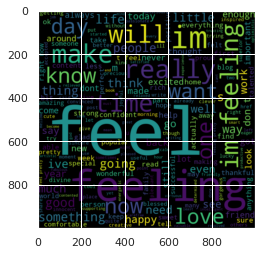

In [261]:
plot_word_cloud(joy_sentences)

In [262]:
sad_sentences=" ";
sentences2=[sent for sent in df_sad['Text']];
sad_sentences=sad_sentences.join(sentences2)

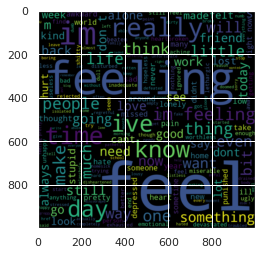

In [263]:
plot_word_cloud(sad_sentences)

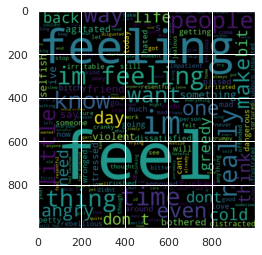

In [264]:
anger_sentences=" ";
sentences3=[sent for sent in df_anger['Text']];
anger_sentences=anger_sentences.join(sentences3)
plot_word_cloud(anger_sentences)

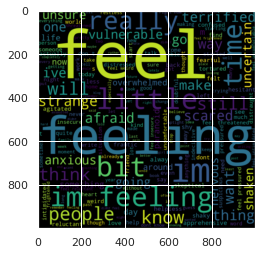

In [265]:
fear_sentences=" ";
sentences4=[sent for sent in df_fear['Text']];
fear_sentences=fear_sentences.join(sentences4)
plot_word_cloud(fear_sentences)

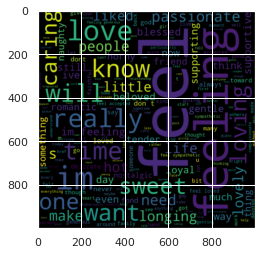

In [266]:
love_sentences=" ";
sentences5=[sent for sent in df_love['Text']];
love_sentences=love_sentences.join(sentences5)
plot_word_cloud(love_sentences)

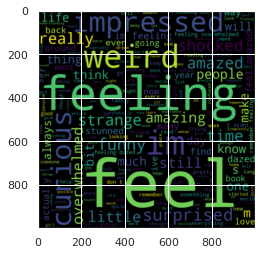

In [267]:
surprise_sentences=" ";
sentences6=[sent for sent in df_surprise['Text']];
surprise_sentences=surprise_sentences.join(sentences6)
plot_word_cloud(surprise_sentences)

In [268]:
from textblob import TextBlob

# Sentiment Analysis

In [269]:
emotions[['polarity', 'subjectivity']] = emotions['Text'].apply(lambda Text: pd.Series(TextBlob(Text).sentiment))

/usr/local/lib/python3.9/dist-packages/pandas/core/frame.py:3641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [270]:
emotions

,Text,emotion,text_tokens,encoded_label,Cluster,polarity,subjectivity
0,i didnt feel humiliated,sadness,"[i, did, nt, feel, humiliated]",4,4,0.000000,0.000000
1,i can go from feeling so hopeless to so damned...,sadness,"[i, can, go, from, feeling, so, hopeless, to, ...",4,2,0.000000,0.000000
2,im grabbing a minute to post i feel greedy wrong,anger,"[i, m, grabbing, a, minute, to, post, i, feel,...",0,4,-0.500000,0.900000
3,i am ever feeling nostalgic about the fireplac...,love,"[i, am, ever, feeling, nostalgic, about, the, ...",3,3,-0.500000,1.000000
4,i am feeling grouchy,anger,"[i, am, feeling, grouchy]",0,3,0.000000,0.000000
...,...,...,...,...,...,...,...
13995,i love those cars and i feel that my second at...,joy,"[i, love, those, cars, and, i, feel, that, my,...",2,4,0.411111,0.522222
13996,i feel anything for relationships the doomed one,sadness,"[i, feel, anything, for, relationships, the, d...",4,1,0.000000,0.000000
13997,i should just let him calm down on his own but...,sadness,"[i, should, just, let, him, calm, down, on, hi...",4,4,0.061111,0.759722
13998,when i saw a man hitting a child of years with...,anger,"[when, i, saw, a, man, hitting, a, child, of, ...",0,4,0.000000,0.000000


In [271]:
def get_tag(val):
    if val <= -0.50:
        return 'Angry'
    elif val > -0.5 and val < 0:
        return 'Overwhelmed'
    elif val < 0.5 and val > 0:
        return 'Anxious'
    elif val >= 0.5:
        return 'Happy'
    else:
        return 'Frustrated'

In [272]:
emotions['Sentiment'] = emotions['polarity'].apply(get_tag)
emotions.head()

<ipython-input-272-baeab3a55b61>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emotions['Sentiment'] = emotions['polarity'].apply(get_tag)


,Text,emotion,text_tokens,encoded_label,Cluster,polarity,subjectivity,Sentiment
0,i didnt feel humiliated,sadness,"[i, did, nt, feel, humiliated]",4,4,0.0,0.0,Frustrated
1,i can go from feeling so hopeless to so damned...,sadness,"[i, can, go, from, feeling, so, hopeless, to, ...",4,2,0.0,0.0,Frustrated
2,im grabbing a minute to post i feel greedy wrong,anger,"[i, m, grabbing, a, minute, to, post, i, feel,...",0,4,-0.5,0.9,Angry
3,i am ever feeling nostalgic about the fireplac...,love,"[i, am, ever, feeling, nostalgic, about, the, ...",3,3,-0.5,1.0,Angry
4,i am feeling grouchy,anger,"[i, am, feeling, grouchy]",0,3,0.0,0.0,Frustrated


In [273]:
emotions['Sentiment'].value_counts()

Anxious        5128
Overwhelmed    3282
Frustrated     2776
Happy          1563
Angry          1251
Name: Sentiment, dtype: int64

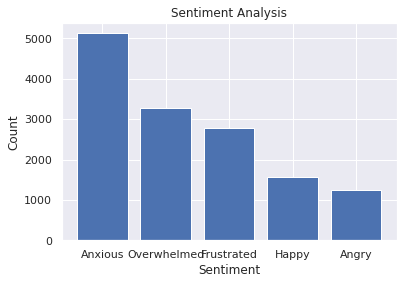

In [274]:
plt.bar(emotions['Sentiment'].value_counts().index, emotions['Sentiment'].value_counts().values)
plt.title('Sentiment Analysis')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()